# **GENIUS ARTIST STATISTICS**

# **0. Table of contents**

In [1041]:
from IPython.display import Markdown # type: ignore
import re
import nbformat # type: ignore
import os

def generate_markdown_toc(notebook_path=None):
    # If no path is provided, use current path (open notebook)
    if notebook_path is None:
        notebook_path = os.path.basename(__file__) if '__file__' in globals() else None
        if notebook_path is None:
            print("Unable to automatically determine notebook path. Please pass it in manually.")
            return
    # Read notebook contents
    with open(notebook_path, 'r', encoding='utf-8') as f:
        nb = nbformat.read(f, as_version=4)
    toc = "## Table of Contents\n\n"
    for cell in nb.cells:
        if cell.cell_type == 'markdown':
            for line in cell.source.splitlines():
                m = re.match(r'^(#+)\s+(.*)', line)
                if m:
                    level = len(m.group(1))
                    title = m.group(2).strip()
                    # Create anchor: remove special characters, lowercase, replace spaces = "-"
                    anchor = re.sub(r'[^a-zA-Z0-9 ]', '', title).lower().replace(' ', '-')
                    toc += f"{'  ' * (level - 1)}- [{title}](#{anchor})\n"
    return Markdown(toc)
generate_markdown_toc("genius-artist-statistic-2025-08-31.ipynb")

## Table of Contents

- [**GENIUS ARTIST STATISTICS**](#genius-artist-statistics)
- [**0. Table of contents**](#0-table-of-contents)
- [**I. Import Library**](#i-import-library)
- [**II. Prepared functions**](#ii-prepared-functions)
- [**III. Import ARTISTs' SONGs**](#iii-import-artists-songs)
  - [**III.1. Get API KEY**](#iii1-get-api-key)
  - [**III.2. Get & save ARTISTs' SONGs JSON**](#iii2-get--save-artists-songs-json)
  - [**III.3. Import saved JSON and create dataframe of ARTISTs' SONGs**](#iii3-import-saved-json-and-create-dataframe-of-artists-songs)
  - [**III.4. Data cleansing for ARTISTs' SONGs**](#iii4-data-cleansing-for-artists-songs)
  - [**III.5. Save ARTISTs' SONGs**](#iii5-save-artists-songs)
  - [**III.6. Describe ARTISTs' SONGs**](#iii6-describe-artists-songs)
- [**IV. Import THUMBNAILs**](#iv-import-thumbnails)
  - [**IV.1. Download primary artist's THUMBNAILs**](#iv1-download-primary-artists-thumbnails)
  - [**IV.2. Download featured artist's THUMBNAILs**](#iv2-download-featured-artists-thumbnails)
  - [**IV.3. Download songs' THUMBNAILs**](#iv3-download-songs-thumbnails)
- [**V. Merge ARTISTs SONGs & THUMBNAILs**](#v-merge-artists-songs--thumbnails)
    - [**V.+ Save ARTISTs' SONGs with THUMBNAILs**](#v-save-artists-songs-with-thumbnails)
- [**VI. Format Datetime**](#vi-format-datetime)
- [**VII. ALL SONGs**](#vii-all-songs)
  - [**VII.1. All songs - BY YEAR**](#vii1-all-songs--by-year)
  - [**VII.2. All songs - BY MONTH**](#vii2-all-songs--by-month)
    - [**VII.2.1. All songs - BY MONTH**](#vii21-all-songs--by-month)
    - [**VII.2.2. Top all songs by pageviews - BY MONTH**](#vii22-top-all-songs-by-pageviews--by-month)
    - [**VII.2.3. [THUMBNAIL] Top all songs by pageviews - BY MONTH**](#vii23-thumbnail-top-all-songs-by-pageviews--by-month)
  - [**VII.3. TOP ALL SONGs by Pageview - OVERTIME**](#vii3-top-all-songs-by-pageview--overtime)
    - [**VII.3.1. Top 20 All Songs by Pageview**](#vii31-top-20-all-songs-by-pageview)
    - [**VII.3.2. [WORDCLOUD] Top All Songs by Pageview**](#vii32-wordcloud-top-all-songs-by-pageview)
    - [**VII.3.3. [TREEMAP] Top All Songs by Pageview**](#vii33-treemap-top-all-songs-by-pageview)
  - [**VII.4. TOP ALL SONGs by ANNOTATIONs - OVERTIME**](#vii4-top-all-songs-by-annotations--overtime)
- [**VIII. SONGs as PRIMARY ARTIST**](#viii-songs-as-primary-artist)
  - [**VIII.1. Songs as primary artist - BY YEAR**](#viii1-songs-as-primary-artist--by-year)
  - [**VIII.2. Songs as primary artist - BY MONTH**](#viii2-songs-as-primary-artist--by-month)
    - [**VIII.2.1 Songs as primary artist - BY MONTH**](#viii21-songs-as-primary-artist--by-month)
    - [**VIII.2.2. Top songs as primary artist by pageviews - BY MONTH**](#viii22-top-songs-as-primary-artist-by-pageviews--by-month)
    - [**VIII.2.3. [THUMBNAIL] Top songs as primary artist by pageviews - BY MONTH**](#viii23-thumbnail-top-songs-as-primary-artist-by-pageviews--by-month)
  - [**VIII.3. TOP SONGs as primary artist by Pageview - OVERTIME**](#viii3-top-songs-as-primary-artist-by-pageview--overtime)
    - [**VIII.3.1. Top 20 Songs as primary artist by Pageview**](#viii31-top-20-songs-as-primary-artist-by-pageview)
    - [**VIII.3.2. [WORDCLOUD] Top Songs as primary artist by Pageview**](#viii32-wordcloud-top-songs-as-primary-artist-by-pageview)
    - [**VIII.3.3. [TREEMAP] Top Songs as primary artist by Pageview**](#viii33-treemap-top-songs-as-primary-artist-by-pageview)
  - [**VIII.4. TOP SONGs as primary artist by ANNOTATIONs - OVERTIME**](#viii4-top-songs-as-primary-artist-by-annotations--overtime)
- [**IX. SONGs as FEATURED ARTIST**](#ix-songs-as-featured-artist)
  - [**IX.1. Songs as featured artist - BY YEAR**](#ix1-songs-as-featured-artist--by-year)
  - [**IX.2. Songs as featured artist - BY MONTH**](#ix2-songs-as-featured-artist--by-month)
    - [**IX.2.1. Songs as featured artist - BY MONTH**](#ix21-songs-as-featured-artist--by-month)
    - [**IX.2.2. Top Songs as featured artist by pageviews - BY MONTH**](#ix22-top-songs-as-featured-artist-by-pageviews--by-month)
    - [**IX.2.3. [THUMBNAIL] Top Songs as featured artist by pageviews - BY MONTH**](#ix23-thumbnail-top-songs-as-featured-artist-by-pageviews--by-month)
  - [**IX.3. TOP SONGs as featured artist by Pageview - OVERTIME**](#ix3-top-songs-as-featured-artist-by-pageview--overtime)
    - [**IX.3.1. Top 20 Songs as featured artist by Pageview**](#ix31-top-20-songs-as-featured-artist-by-pageview)
    - [**IX.3.2. [WORDCLOUD] Top Songs as feature artist by Pageview**](#ix32-wordcloud-top-songs-as-feature-artist-by-pageview)
    - [**IX.3.3. [TREEMAP] Top Songs as featured artist by Pageview**](#ix33-treemap-top-songs-as-featured-artist-by-pageview)
  - [**IX.4. TOP SONGs as featured artist by ANNOTATIONs - OVERTIME**](#ix4-top-songs-as-featured-artist-by-annotations--overtime)
- [**X. FEATURED ARTISTs (primary songs)**](#x-featured-artists-primary-songs)
  - [**X.1. Featured artists - BY YEAR**](#x1-featured-artists--by-year)
  - [**X.2. Featured artists - BY MONTH**](#x2-featured-artists--by-month)
    - [**X.2.1. Featured artists - BY MONTH**](#x21-featured-artists--by-month)
    - [**X.2.2. Top featured artists by pageviews - BY MONTH**](#x22-top-featured-artists-by-pageviews--by-month)
    - [**X.2.3. [THUMBNAIL] Featured artitst by pageviews - BY MONTH**](#x23-thumbnail-featured-artitst-by-pageviews--by-month)
  - [**X.3. TOP FEATURED ARTISTs by Pageview - OVERTIME**](#x3-top-featured-artists-by-pageview--overtime)
    - [**X.3.1. Top 20 Featured Artists by Songs**](#x31-top-20-featured-artists-by-songs)
    - [**X.3.2. [WORDCLOUD] Top Featured Artists by Songs**](#x32-wordcloud-top-featured-artists-by-songs)
    - [**X.3.3. [TREEMAP] Top Featured Artists by Songs**](#x33-treemap-top-featured-artists-by-songs)
  - [**X.4. TOP SONG of each TOP FEATURED ARTISTs by Pageview - OVERTIME**](#x4-top-song-of-each-top-featured-artists-by-pageview--overtime)
- [**XI. ARTISTs FEATURING WITH**](#xi-artists-featuring-with)
  - [**XI.1. Artists featuring with - BY YEAR**](#xi1-artists-featuring-with--by-year)
  - [**XI.2. Artists featuring with - BY MONTH**](#xi2-artists-featuring-with--by-month)
    - [**XI.2.1. Artists featuring with - BY MONTH**](#xi21-artists-featuring-with--by-month)
    - [**XI.2.2. Top artists featuring with by pageviews - BY MONTH**](#xi22-top-artists-featuring-with-by-pageviews--by-month)
    - [**XI.2.3. [THUMBNAIL] Top artists featuring with by pageviews - BY MONTH**](#xi23-thumbnail-top-artists-featuring-with-by-pageviews--by-month)
  - [**XI.3. TOP ARTISTs FEATURING WITH by Pageview - OVERTIME**](#xi3-top-artists-featuring-with-by-pageview--overtime)
    - [**XI.3.1. Top 20 Artists Featuring With by Songs**](#xi31-top-20-artists-featuring-with-by-songs)
    - [**XI.3.2. [WORDCLOUD] Top 20 Artists Featuring With by Songs**](#xi32-wordcloud-top-20-artists-featuring-with-by-songs)
    - [**XI.3.3. [TREEMAP] Top 20 Artists Featuring With by Songs**](#xi33-treemap-top-20-artists-featuring-with-by-songs)
  - [**XI.4. TOP SONG of each TOP ARTISTs FEATURING WITH by Pageview - OVERTIME**](#xi4-top-song-of-each-top-artists-featuring-with-by-pageview--overtime)
- [**XII. SONGs as CO-PRIMARY ARTIST**](#xii-songs-as-coprimary-artist)
  - [**XII.1. Songs as co-primary artist - BY YEAR**](#xii1-songs-as-coprimary-artist--by-year)
  - [**XII.2. Songs as co-primary artist by Pageview - OVERTIME**](#xii2-songs-as-coprimary-artist-by-pageview--overtime)
    - [**XII.2.1. All Songs as co-primary artist by Pageview**](#xii21-all-songs-as-coprimary-artist-by-pageview)
    - [**XII.2.2. [TREEMAP] All Songs as co-primary artist by Pageview**](#xii22-treemap-all-songs-as-coprimary-artist-by-pageview)
- [**THE END**](#the-end)


---
# **I. Import Library**

In [520]:
import pandas as pd # type: ignore
from datetime import datetime
import matplotlib.pyplot as plt # type: ignore
import matplotlib.patches as mpatches  # type: ignore
import matplotlib.cm as cm # type: ignore
import matplotlib.dates as mdates
import seaborn as sns # type: ignore
import numpy as np  # type: ignore
import os
import json
from zoneinfo import ZoneInfo
import requests
import re
from urllib.parse import urlparse

from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib.image as mpimg
import matplotlib.colors as mcolors
from PIL import Image

import calmap
from wordcloud import WordCloud
import squarify

import api_key
import importlib

> ##### *For display

In [61]:
pd.set_option('display.max_columns', None)
pd.options.display.max_rows = 10
pd.options.display.min_rows = 10

---
# **II. Prepared functions**

In [176]:
def format_kmb(value):
    if value >= 1_000_000_000:
        return f"{value/1_000_000_000:.2f}B"
    elif value >= 1_000_000:
        return f"{value/1_000_000:.1f}M"
    elif value >= 1_000:
        return f"{value/1_000:.0f}K"
    else:
        return str(int(value))

---
# **III. Import ARTISTs' SONGs**

## **III.1. Get API KEY**

In [18]:
importlib.reload(api_key)   # reload module
client_access_token = api_key.client_access_token

## **III.2. Get & save ARTISTs' SONGs JSON**

In [116]:
base_url = "https://api.genius.com"

headers = {"Authorization": f"Bearer {client_access_token}"}

def get_artist_id(artist_name):
    """Get artist_id"""
    search_url = f"{base_url}/search"
    params = {"q": artist_name}
    response = requests.get(search_url, params=params, headers=headers).json()
    
    for hit in response["response"]["hits"]:
        if hit["result"]["primary_artist"]["name"].lower() == artist_name.lower():
            return hit["result"]["primary_artist"]["id"]
    return None

def get_all_songs_json(artist_id, max_songs=2000):
    """Get all response from artist_id"""
    all_responses = []
    page = 1
    per_page = 50 
    while True:
        url = f"{base_url}/artists/{artist_id}/songs"
        params = {"per_page": per_page, "page": page, "sort": "title"}
        response = requests.get(url, params=params, headers=headers).json()

        song_list = response["response"]["songs"]
        if not song_list:
            break
        
        all_responses.append(response) 
        print(f"Page {page}: {len(song_list)} songs")
        
        page += 1
        if (page - 1) * per_page >= max_songs:
            break
    
    return all_responses

if __name__ == "__main__":
    artist_name = "Drake"
    artist_id = get_artist_id(artist_name)
    if artist_id:
        print(f"Artist ID of {artist_name}: {artist_id}")
        responses = get_all_songs_json(artist_id)
        save_dir = "/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/data"
        os.makedirs(save_dir, exist_ok=True)
        save_path = os.path.join(save_dir, f"{artist_name.replace(' ', '_')}_songs.json")
        with open(save_path, "w", encoding="utf-8") as f:
            json.dump(responses, f, ensure_ascii=False, indent=2)
        print(f"Saved {len(responses)} response JSON to {save_path}")
    else:
        print("Can't find this artist in Genius")

Artist ID of Drake: 130
Page 1: 45 songs
Page 2: 49 songs
Page 3: 47 songs
Page 4: 45 songs
Page 5: 45 songs
Page 6: 48 songs
Page 7: 47 songs
Page 8: 47 songs
Page 9: 45 songs
Page 10: 47 songs
Page 11: 49 songs
Page 12: 47 songs
Page 13: 46 songs
Page 14: 48 songs
Page 15: 43 songs
Page 16: 46 songs
Page 17: 44 songs
Page 18: 43 songs
Page 19: 48 songs
Page 20: 45 songs
Page 21: 47 songs
Page 22: 46 songs
Page 23: 40 songs
Page 24: 49 songs
Page 25: 50 songs
Page 26: 47 songs
Page 27: 50 songs
Page 28: 45 songs
Page 29: 46 songs
Page 30: 47 songs
Page 31: 48 songs
Page 32: 49 songs
Page 33: 46 songs
Page 34: 45 songs
Page 35: 49 songs
Page 36: 42 songs
Page 37: 45 songs
Page 38: 48 songs
Page 39: 24 songs
Saved 39 response JSON to /Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/data/Drake_songs.json


## **III.3. Import saved JSON and create dataframe of ARTISTs' SONGs**

In [790]:
with open("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/data/Drake_songs.json", "r", encoding="utf-8") as f:
    data = json.load(f)
all_songs = []
for page in data:
    songs = page["response"]["songs"]
    all_songs.extend(songs)
all_song_df = pd.json_normalize(all_songs)

def extract_first_artist(x):
    if isinstance(x, list) and len(x) > 0:
        artist = x[0]
        return pd.Series({
            "featured_artists_id": artist.get("id"),
            "featured_artists_name": artist.get("name"),
            "featured_artists_image_url": artist.get("image_url")
        })
    return pd.Series({"featured_artists_id": None, "featured_artists_name": None, "featured_artists_image_url": None})

all_song_df = all_song_df.join(all_song_df["featured_artists"].apply(extract_first_artist))

print("Data shape: ",all_song_df.shape)
all_song_df.info()

Data shape:  (1787, 41)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1787 entries, 0 to 1786
Data columns (total 41 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   annotation_count                                 1787 non-null   int64  
 1   api_path                                         1787 non-null   object 
 2   artist_names                                     1787 non-null   object 
 3   full_title                                       1787 non-null   object 
 4   header_image_thumbnail_url                       1787 non-null   object 
 5   header_image_url                                 1787 non-null   object 
 6   id                                               1787 non-null   int64  
 7   lyrics_owner_id                                  1787 non-null   int64  
 8   lyrics_state                                     1787 non-null   object 
 9   path  

## **III.4. Data cleansing for ARTISTs' SONGs**

In [791]:
# 1. Drop duplicates by id
all_song_df = all_song_df.drop_duplicates(subset=["id"])

# 2. Reset index
all_song_df = all_song_df.reset_index(drop=True)

# 3. Fillna for numeric = 0
for col in all_song_df.select_dtypes(include=np.number).columns:
    all_song_df[col] = all_song_df[col].fillna(0)

# 4. Fillna for text = "Unknown"
for col in all_song_df.select_dtypes(include="object").columns:
    all_song_df[col] = all_song_df[col].fillna("Unknown")

# 5. Standardize data type (datetime)
if "release_date_for_display" in all_song_df.columns:
    all_song_df["release_date_for_display"] = pd.to_datetime(all_song_df["release_date_for_display"], errors="coerce")

# 6. Normalize text
text_cols = all_song_df.select_dtypes(include="object").columns
for col in text_cols:
    all_song_df[col] = all_song_df[col].astype(str).str.strip()

# 7. Drop date null and outlier records
# all_song_df = all_song_df[all_song_df["release_date_for_display"] <= "2026-01-01"]

# 8. Sort dataframe by date descending
all_song_df = all_song_df.sort_values(by="release_date_for_display",ascending=False)

# 9. Remove songs not related to Artist
all_song_df = all_song_df[(all_song_df["primary_artist.id"] == 130) | (all_song_df["featured_artists_id"] == 130)]

# 10. Remove songs not have pageview (unreview song posted by fan, remix songs...)
all_song_df = all_song_df[all_song_df["stats.pageviews"] > 0]

print("Data shape: ",all_song_df.shape)
print("\nData info: \n")
all_song_df.info()
print("\nMissing Values:\n",all_song_df.isna().sum().sort_values(ascending=False).head(20))
all_song_df.head(3)

Data shape:  (782, 41)

Data info: 

<class 'pandas.core.frame.DataFrame'>
Index: 782 entries, 1716 to 1785
Data columns (total 41 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   annotation_count                                 782 non-null    int64         
 1   api_path                                         782 non-null    object        
 2   artist_names                                     782 non-null    object        
 3   full_title                                       782 non-null    object        
 4   header_image_thumbnail_url                       782 non-null    object        
 5   header_image_url                                 782 non-null    object        
 6   id                                               782 non-null    int64         
 7   lyrics_owner_id                                  782 non-null    int64         
 8   lyri

,annotation_count,api_path,artist_names,full_title,header_image_thumbnail_url,header_image_url,id,lyrics_owner_id,lyrics_state,path,primary_artist_names,pyongs_count,relationships_index_url,release_date_for_display,release_date_with_abbreviated_month_for_display,song_art_image_thumbnail_url,song_art_image_url,title,title_with_featured,url,featured_artists,primary_artists,release_date_components.year,release_date_components.month,release_date_components.day,stats.unreviewed_annotations,stats.hot,stats.pageviews,primary_artist.api_path,primary_artist.header_image_url,primary_artist.id,primary_artist.image_url,primary_artist.is_meme_verified,primary_artist.is_verified,primary_artist.name,primary_artist.url,primary_artist.iq,release_date_components,featured_artists_id,featured_artists_name,featured_artists_image_url
1716,35,/songs/12138054,Drake & Central Cee,Which One by Drake & Central Cee,https://images.genius.com/949345e05360f0a372eb...,https://images.genius.com/949345e05360f0a372eb...,12138054,18337684,complete,/Drake-and-central-cee-which-one-lyrics,Drake & Central Cee,6.0,https://genius.com/Drake-and-central-cee-which...,2025-07-25,"Jul. 25, 2025",https://images.genius.com/949345e05360f0a372eb...,https://images.genius.com/949345e05360f0a372eb...,Which One,Which One,https://genius.com/Drake-and-central-cee-which...,[],"[{'api_path': '/artists/130', 'header_image_ur...",2025.0,7.0,25.0,30,False,173692.0,/artists/130,https://images.genius.com/a859c88bc62e4f975a11...,130,https://images.genius.com/b54877c4f4023ccb1223...,False,False,Drake,https://genius.com/artists/Drake,0.0,0.0,0.0,Unknown,Unknown
1690,16,/songs/12101481,Drake,What Did I Miss? by Drake,https://images.genius.com/f00b59b92981cd746211...,https://images.genius.com/f00b59b92981cd746211...,12101481,6877117,complete,/Drake-what-did-i-miss-lyrics,Drake,17.0,https://genius.com/Drake-what-did-i-miss-sample,2025-07-05,"Jul. 5, 2025",https://images.genius.com/f00b59b92981cd746211...,https://images.genius.com/f00b59b92981cd746211...,What Did I Miss?,What Did I Miss?,https://genius.com/Drake-what-did-i-miss-lyrics,[],"[{'api_path': '/artists/130', 'header_image_ur...",2025.0,7.0,5.0,5,False,634317.0,/artists/130,https://images.genius.com/a859c88bc62e4f975a11...,130,https://images.genius.com/b54877c4f4023ccb1223...,False,False,Drake,https://genius.com/artists/Drake,0.0,0.0,0.0,Unknown,Unknown
267,7,/songs/11455701,Drake,CRYING IN CHANEL by Drake,https://images.genius.com/825cd524d153c58e7540...,https://images.genius.com/825cd524d153c58e7540...,11455701,126836,complete,/Drake-crying-in-chanel-lyrics,Drake,0.0,https://genius.com/Drake-crying-in-chanel-sample,2025-02-14,"Feb. 14, 2025",https://images.genius.com/825cd524d153c58e7540...,https://images.genius.com/825cd524d153c58e7540...,CRYING IN CHANEL,CRYING IN CHANEL,https://genius.com/Drake-crying-in-chanel-lyrics,[],"[{'api_path': '/artists/130', 'header_image_ur...",2025.0,2.0,14.0,5,False,148692.0,/artists/130,https://images.genius.com/a859c88bc62e4f975a11...,130,https://images.genius.com/b54877c4f4023ccb1223...,False,False,Drake,https://genius.com/artists/Drake,0.0,0.0,0.0,Unknown,Unknown


## **III.5. Save ARTISTs' SONGs**

In [792]:
all_song_df.to_excel('/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/data/all_artist_song_df.xlsx', index=False)

## **III.6. Describe ARTISTs' SONGs**

In [793]:
all_song_df[["id","release_date_for_display","stats.pageviews","pyongs_count","annotation_count","primary_artist.iq"]] \
    .describe(include="all") \
    .apply(lambda col: col.map(lambda x: f"{x:,.0f}" if pd.api.types.is_numeric_dtype(col) and pd.notna(x) else x))

,id,release_date_for_display,stats.pageviews,pyongs_count,annotation_count,primary_artist.iq
count,782,658,782,782,782,782
mean,"3,165,989",2015-11-26 18:49:14.407294976,"621,829",69,13,"1,071"
min,147,2006-02-14 00:00:00,"5,062",0,0,0
25%,"58,468",2011-10-31 00:00:00,"25,037",2,3,0
50%,"2,453,480",2016-03-24 00:00:00,"187,154",11,9,0
75%,"5,250,694",2019-06-15 00:00:00,"757,362",45,20,0
max,"12,138,054",2025-07-25 00:00:00,"10,075,254","2,554",113,"67,462"
std,"3,404,811",NaN,"1,115,372",196,13,"4,594"


In [794]:
all_song_df[["artist_names","primary_artist_names","release_date_with_abbreviated_month_for_display","title","title_with_featured","featured_artists_name"]]    \
     .replace({"release_date_with_abbreviated_month_for_display": {"Unknown": np.nan},
              "featured_artists_name": {"Unknown": np.nan, "Drake": np.nan}}) \
     .describe(include="object")

,artist_names,primary_artist_names,release_date_with_abbreviated_month_for_display,title,title_with_featured,featured_artists_name
count,782,782,684,782,782,188
unique,263,116,352,775,781,106
top,Drake,Drake,"Mar. 18, 2017",Amen,Work (Ft. Drake),Lil Wayne
freq,375,562,23,2,2,12


---
# **IV. Import THUMBNAILs**

## **IV.1. Download primary artist's THUMBNAILs**

In [142]:
primary_artist_thumbnail = all_song_df[["primary_artist.id","primary_artist.name","primary_artist.image_url"]].drop_duplicates().sort_values(by="primary_artist.id")
output_dir = "/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/primary-artist-thumbnail/"
os.makedirs(output_dir, exist_ok=True)

def download_primary_thumbnail(row):
    if pd.isna(row['primary_artist.image_url']):
        return None
    try:
        filename = re.sub(r'[^A-Za-z0-9]+', '_', row['primary_artist.name']) + '.jpg'
        filepath = os.path.join(output_dir, filename)
        response = requests.get(row['primary_artist.image_url'], stream=True)
        response.raise_for_status()
        with open(filepath, 'wb') as out_file:
            for chunk in response.iter_content(chunk_size=8192):
                out_file.write(chunk)
        return filepath
    except Exception as e:
        print(f"Error downloading image for artist {row['primary_artist.name']}: {str(e)}")
        return None

primary_artist_thumbnail['thumbnail_local_path'] = primary_artist_thumbnail.apply(download_primary_thumbnail, axis=1)
primary_artist_thumbnail

,primary_artist.id,primary_artist.name,primary_artist.image_url,thumbnail_local_path
1037,2,JAY-Z,https://images.genius.com/dab4680bbb0569024ef3...,/Users/tainguyen/Desktop/Python/github-reposit...
59,3,Fabolous,https://images.genius.com/8eaa26a5f0d71652f7e3...,/Users/tainguyen/Desktop/Python/github-reposit...
116,4,Lil Wayne,https://images.genius.com/6aa00441a7eb56b06aab...,/Users/tainguyen/Desktop/Python/github-reposit...
168,13,Gucci Mane,https://images.genius.com/82117b940dc8deada6f0...,/Users/tainguyen/Desktop/Python/github-reposit...
344,42,The Game,https://images.genius.com/23a3ca8df26e9dea3863...,/Users/tainguyen/Desktop/Python/github-reposit...
...,...,...,...,...
1027,4419750,KiNGK@$H,https://images.genius.com/bac7d41c86f85dad542a...,/Users/tainguyen/Desktop/Python/github-reposit...
8,4422616,AdiSigma,https://images.genius.com/d60375ffc6697382d848...,/Users/tainguyen/Desktop/Python/github-reposit...
1757,4460284,Josiah Ali,https://assets.genius.com/images/default_avata...,/Users/tainguyen/Desktop/Python/github-reposit...
498,4491727,K9 OG,https://assets.genius.com/images/default_avata...,/Users/tainguyen/Desktop/Python/github-reposit...


## **IV.2. Download featured artist's THUMBNAILs**

In [144]:
featured_artist_thumbnail = all_song_df[all_song_df["featured_artists_id"] != 0][["featured_artists_id","featured_artists_name","featured_artists_image_url"]].drop_duplicates().sort_values(by="featured_artists_id")
output_dir = "/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/featured-artist-thumbnail/"
os.makedirs(output_dir, exist_ok=True)

def download_featured_thumbnail(row):
    if pd.isna(row['featured_artists_image_url']):
        return None
    try:
        filename = re.sub(r'[^A-Za-z0-9]+', '_', row['featured_artists_name']) + '.jpg'
        filepath = os.path.join(output_dir, filename)
        response = requests.get(row['featured_artists_image_url'], stream=True)
        response.raise_for_status()
        with open(filepath, 'wb') as out_file:
            for chunk in response.iter_content(chunk_size=8192):
                out_file.write(chunk)
        return filepath
    except Exception as e:
        print(f"Error downloading image for artist {row['featured_artists_name']}: {str(e)}")
        return None

featured_artist_thumbnail['thumbnail_local_path'] = featured_artist_thumbnail.apply(download_featured_thumbnail, axis=1)
featured_artist_thumbnail

,featured_artists_id,featured_artists_name,featured_artists_image_url,thumbnail_local_path
836,2.0,JAY-Z,https://images.genius.com/dab4680bbb0569024ef3...,/Users/tainguyen/Desktop/Python/github-reposit...
1772,4.0,Lil Wayne,https://images.genius.com/6aa00441a7eb56b06aab...,/Users/tainguyen/Desktop/Python/github-reposit...
1342,38.0,Juvenile,https://images.genius.com/9f9fe00ecfc85771a363...,/Users/tainguyen/Desktop/Python/github-reposit...
216,56.0,Nas,https://images.genius.com/c4c4ec72fe6020b7870f...,/Users/tainguyen/Desktop/Python/github-reposit...
1613,67.0,Jeezy,https://images.genius.com/2fac56415ebd679b9c2a...,/Users/tainguyen/Desktop/Python/github-reposit...
...,...,...,...,...
20,3322947.0,Luh Tyler,https://images.genius.com/35e6d3b667fe0fc3cd05...,/Users/tainguyen/Desktop/Python/github-reposit...
958,3470991.0,MY DICK,https://assets.genius.com/images/default_avata...,/Users/tainguyen/Desktop/Python/github-reposit...
1501,3532533.0,Lil Batakum,https://assets.genius.com/images/default_avata...,/Users/tainguyen/Desktop/Python/github-reposit...
1051,3694947.0,Harper (Rapper),https://assets.genius.com/images/default_avata...,/Users/tainguyen/Desktop/Python/github-reposit...


## **IV.3. Download songs' THUMBNAILs**

In [ ]:
song_thumbnail = all_song_df[["id","full_title","song_art_image_thumbnail_url"]].drop_duplicates().sort_values(by="id")
output_dir = "/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/song-artist-thumbnail/"
os.makedirs(output_dir, exist_ok=True)

def download_song_image(row):
    if pd.isna(row['song_art_image_thumbnail_url']):
        return None
    try:
        filename = re.sub(r'[^A-Za-z0-9]+', '_', row['full_title']) + '.jpg'
        filepath = os.path.join(output_dir, filename)
        response = requests.get(row['song_art_image_thumbnail_url'], stream=True)
        response.raise_for_status()
        with open(filepath, 'wb') as out_file:
            for chunk in response.iter_content(chunk_size=8192):
                out_file.write(chunk)
        return filepath
    except Exception as e:
        print(f"Error downloading image for song {row['full_title']}: {str(e)}")
        return None

# Add new column for local paths
song_thumbnail['thumbnail_local_path'] = song_thumbnail.apply(download_song_image, axis=1)
song_thumbnail

---
# **V. Merge ARTISTs SONGs & THUMBNAILs**

In [ ]:
primary_artist_thumbnail = primary_artist_thumbnail.rename(columns={"thumbnail_local_path": "primary_artist_thumbnail_local_path"})
featured_artist_thumbnail = featured_artist_thumbnail.rename(columns={"thumbnail_local_path": "feature_artist_thumbnail_local_path"})
song_thumbnail = song_thumbnail.rename(columns={"thumbnail_local_path": "song_thumbnail_local_path"})

all_song_with_thumbnail_df = all_song_df.merge(primary_artist_thumbnail[["primary_artist.id", "primary_artist_thumbnail_local_path"]], on="primary_artist.id", how="left")
all_song_with_thumbnail_df = all_song_with_thumbnail_df.merge(featured_artist_thumbnail[["featured_artists_id", "feature_artist_thumbnail_local_path"]], on="featured_artists_id", how="left")
all_song_with_thumbnail_df = all_song_with_thumbnail_df.merge(song_thumbnail[["id", "song_thumbnail_local_path"]], on="id", how="left")
all_song_with_thumbnail_df

### **V.+ Save ARTISTs' SONGs with THUMBNAILs**

In [796]:
all_song_with_thumbnail_df.to_excel('/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/data/all_song_with_thumbnail_df.xlsx', index=False)

---
# **VI. Format Datetime**

In [797]:
all_song_with_thumbnail_df["year"] = all_song_with_thumbnail_df["release_date_for_display"].dt.to_period("Y")
all_song_with_thumbnail_df["month_number"] = all_song_with_thumbnail_df["release_date_for_display"].dt.month
all_song_with_thumbnail_df["month"] = all_song_with_thumbnail_df["release_date_for_display"].dt.strftime("%b")
all_song_with_thumbnail_df["year_month"] = all_song_with_thumbnail_df["release_date_for_display"].dt.to_period("M")
all_song_with_thumbnail_df["date"] = all_song_with_thumbnail_df["release_date_for_display"].dt.floor("D")

---
# **VII. ALL SONGs**

## **VII.1. All songs - BY YEAR**

/var/folders/7q/sfnchm8d521c9vslcz802kw80000gn/T/ipykernel_96145/3552176535.py:62: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(total_song_year_agg["year"], fontsize=10, fontweight="bold", y=-0.01)


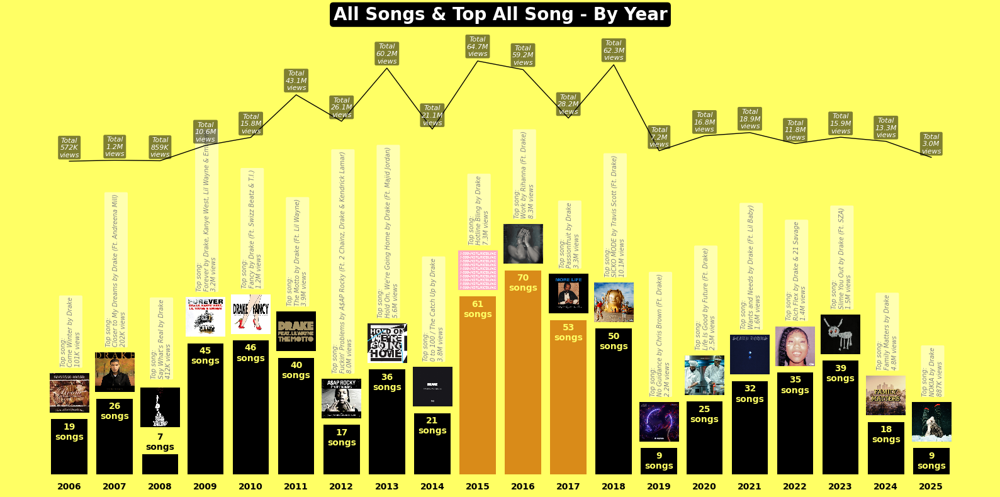

In [1042]:
total_song_year_agg = (
    all_song_with_thumbnail_df
    .sort_values("release_date_for_display")
    .groupby("year")
    .agg(count_track=("release_date_for_display", "count"), sum_pageviews=("stats.pageviews","sum"))
    .reset_index()
)
total_song_year_agg_song = (
    all_song_with_thumbnail_df
    .sort_values("release_date_for_display")
    .groupby(["year","full_title","song_thumbnail_local_path"])
    .agg(sum_pageviews=("stats.pageviews", "sum"))
    .reset_index()
)
top_song_year = (
    total_song_year_agg_song
    .sort_values(["year", "sum_pageviews"], ascending=[True, False])
    .drop_duplicates("year")
    .rename(columns={"full_title": "top_song","sum_pageviews":"top_song_pageview"})
)
total_song_year_agg = total_song_year_agg.merge(top_song_year, on="year", how="left")
total_song_year_agg["top_song"] = "Top song:\n" + total_song_year_agg["top_song"] + "\n" + total_song_year_agg["top_song_pageview"].apply(format_kmb) + " views"
total_song_year_agg["year"] = total_song_year_agg["year"].astype(str)

top3_year = total_song_year_agg.nlargest(3,"count_track")
colors = [
    "#d98b19" if year in top3_year["year"].values else "black"
    for year in total_song_year_agg["year"]
]


fig, ax = plt.subplots(figsize=(16,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
bars = plt.bar(total_song_year_agg["year"], total_song_year_agg["count_track"], color=colors)

ax2 = ax.twinx()
ax2.plot(total_song_year_agg["year"], total_song_year_agg["sum_pageviews"]+200_000_000, color="black", linewidth=1, label="Total pageviews")

for bar, top_song, song_thumbnail_local_path in zip(bars, total_song_year_agg["top_song"], total_song_year_agg["song_thumbnail_local_path"]):
    if bar.get_height() > 7:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()-1, f"{bar.get_height():,.0f}" + "\nsongs", ha='center', va='top', fontsize=10, fontweight="bold", color="#ffff64")
        ax.text(bar.get_x() + bar.get_width()/2-0.2, bar.get_height()+18, top_song, ha='left', va='bottom', fontsize=7, fontstyle="italic", rotation=90, color="gray", bbox=dict(facecolor="white", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
    else:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()+1, f"{bar.get_height():,.0f}" + "\nsongs", ha='center', va='bottom', fontsize=10, fontweight="bold", color="black")
        ax.text(bar.get_x() + bar.get_width()/2-0.2, bar.get_height()+26, top_song, ha='left', va='bottom', fontsize=7, fontstyle="italic", rotation=90, color="gray", bbox=dict(facecolor="white", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
        
    if song_thumbnail_local_path and os.path.exists(song_thumbnail_local_path):
        try:
            img = mpimg.imread(song_thumbnail_local_path)
            imagebox = OffsetImage(img, zoom=0.15)
            if bar.get_height() > 7:
                ab = AnnotationBbox(imagebox, (bar.get_x() + bar.get_width()/2, bar.get_height()+9), frameon=False)
            else:
                ab = AnnotationBbox(imagebox, (bar.get_x() + bar.get_width()/2, bar.get_height()+16), frameon=False)
            ax.add_artist(ab)
        except Exception as e:
            print(f"Error loading image {song_thumbnail_local_path}: {e}")

for i, sum_pageviews in enumerate(total_song_year_agg["sum_pageviews"]+200_000_000):
    ax2.text(i, sum_pageviews*1.01, "Total\n" + format_kmb(sum_pageviews-200_000_000) + "\nviews", ha="center", va="bottom", fontsize=8, color="white", fontstyle="italic", bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))

ax.set_xticklabels(total_song_year_agg["year"], fontsize=10, fontweight="bold", y=-0.01)
ax.set_yticklabels([])
ax.tick_params(axis='both', length=0)
ax.set_ylim(0,150)

ax2.tick_params(axis='both', length=0)
ax2.set_yticklabels([])
ax2.set_ylim(0,80_000_000+200_000_000)

plt.title("All Songs & Top All Song - By Year", fontweight="bold", color="white", fontsize=20, pad=20, bbox=dict(facecolor="black", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout()
sns.despine(bottom = True, left = True)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VII.1. All songs BY YEAR.png", bbox_inches="tight")
plt.show()

## **VII.2. All songs - BY MONTH**

### **VII.2.1. All songs - BY MONTH**

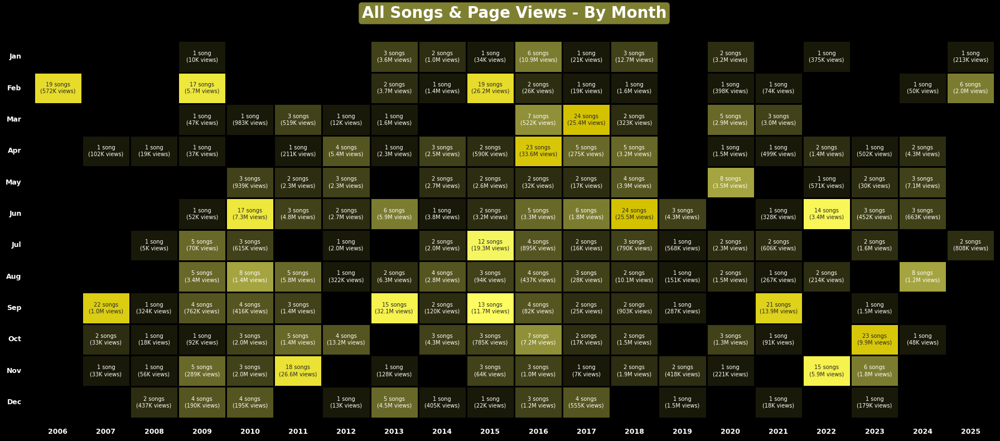

In [1043]:
total_song_pivot_track = all_song_with_thumbnail_df.pivot_table(
    index="month_number",
    columns="year",
    values="release_date_for_display",
    aggfunc="count",
    fill_value=0
)

total_song_pivot_pageviews = all_song_with_thumbnail_df.pivot_table(
    index="month_number",
    columns="year",
    values="stats.pageviews",
    aggfunc="sum",
    fill_value=0
)

month_order = all_song_with_thumbnail_df[["month_number","month"]].drop_duplicates().dropna(subset=["month"]).sort_values("month_number")["month"].values
total_song_pivot_track.index = month_order
total_song_pivot_pageviews.index = month_order
mask = total_song_pivot_track == 0

annot = total_song_pivot_track.map(lambda x: f"{x:,.0f} song" if x == 1 else (f"{x:,.0f} songs" if x > 1 else "")) + "\n" + total_song_pivot_pageviews.map(lambda x: f"({format_kmb(x)} views)" if x != 0 else "")

cmap = mcolors.LinearSegmentedColormap.from_list("custom", [(0, "#19190a"), (0.5, "#ffff64"), (1, "#d4c200")])

fig, ax = plt.subplots(figsize=(18,8), facecolor="black")
ax.set_facecolor("black")
sns.heatmap(total_song_pivot_track, annot=annot, fmt="", cmap=cmap, linewidths=1, linecolor="black", cbar=False, mask=mask, annot_kws={"fontsize":7})
plt.title("All Songs & Page Views - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="#ffff64", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.yticks(rotation=0, fontsize=9, fontweight="bold", color="white", x=-0.01)
plt.xticks(rotation=0, fontsize=9, fontweight="bold", color="white", y=-0.02)
plt.xlabel("")
plt.tick_params(axis='both', length=0)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VII.2.1. All songs BY MONTH.png", bbox_inches="tight")
plt.show()

### **VII.2.2. Top all songs by pageviews - BY MONTH**

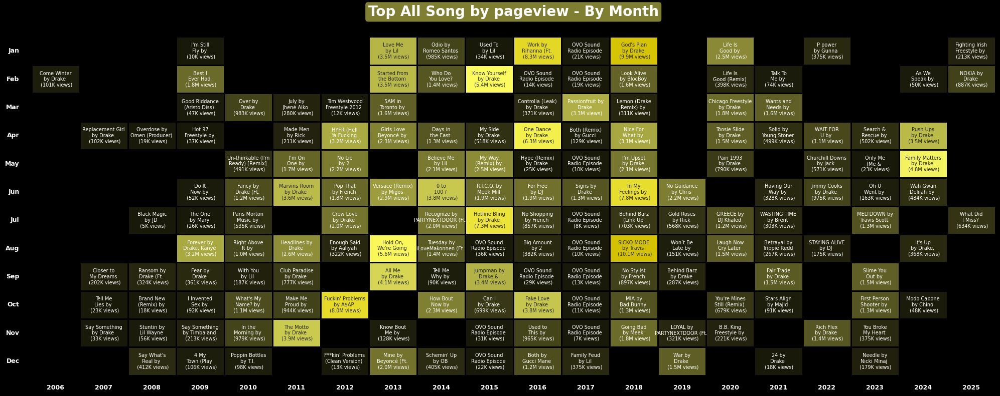

In [1044]:
total_song_month_agg = (
    all_song_with_thumbnail_df
    .groupby(["year", "month_number", "full_title", "id"])
    .agg(sum_pageview=("stats.pageviews", "sum"))
    .reset_index()
)
total_song_month_agg_top = (
    total_song_month_agg
    .sort_values(["year", "month_number", "sum_pageview"], ascending=[True, True, False])
    .drop_duplicates(subset=["year", "month_number"])
)
total_song_month_agg_top_pivot = total_song_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="full_title"
)
total_song_month_agg_top_pivot_pageview = total_song_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="sum_pageview"
)

def shorten_text(text):
    words = str(text).split()
    words = words[:4]
    if len(words) > 2:
        return " ".join(words[:2]) + "\n" + " ".join(words[2:])
    else:
        return " ".join(words)

annot = (total_song_month_agg_top_pivot.stack()
    .astype(str)
    .to_frame("full_title")
    .assign(full_title=lambda df: df["full_title"].apply(shorten_text))
    .join(total_song_month_agg_top_pivot_pageview.stack().to_frame("sum_pageview"))
    .apply(lambda row: f"{row['full_title']} \n ({format_kmb(row['sum_pageview'])} views)", axis=1)
    .unstack()
)

total_song_month_agg_top_pivot_pageview.index = month_order
annot.index = month_order
cmap = mcolors.LinearSegmentedColormap.from_list("custom", [(0, "#19190a"), (0.5, "#ffff64"), (1, "#d4c200")])

fig, ax = plt.subplots(figsize=(20,8), facecolor="black")
ax.set_facecolor("black")
sns.heatmap(total_song_month_agg_top_pivot_pageview, annot=annot, fmt="", cmap=cmap, linewidths=1, linecolor="black", cbar=False, mask=total_song_month_agg_top_pivot_pageview.isna(), annot_kws={"fontsize":7})
plt.title("Top All Song by pageview - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="#ffff64", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.yticks(rotation=0, fontsize=9, fontweight="bold", color="white", x=-0.01)
plt.xticks(rotation=0, fontsize=9, fontweight="bold", color="white", y=-0.02)
plt.xlabel("")
plt.tick_params(axis='both', length=0)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VII.2.2. Top all songs by pageviews BY MONTH.png", bbox_inches="tight")
plt.show()

### **VII.2.3. [THUMBNAIL] Top all songs by pageviews - BY MONTH**

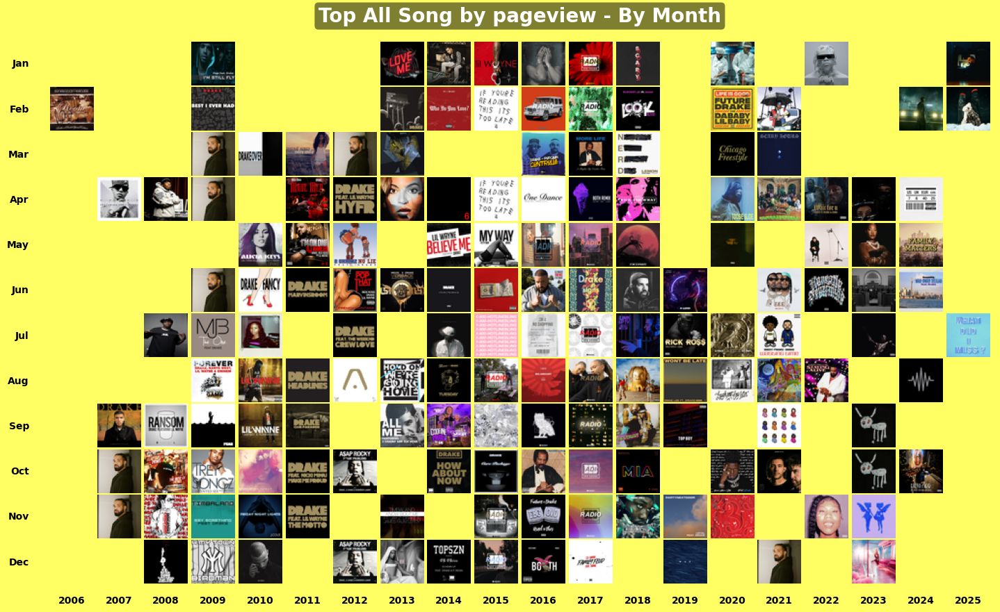

In [1045]:
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

song_to_img_path = dict(zip(all_song_with_thumbnail_df['id'], all_song_with_thumbnail_df['song_thumbnail_local_path']))

total_song_month_agg = (
    all_song_with_thumbnail_df
    .groupby(["year", "month_number", "id"])
    .agg(sum_pageview=("stats.pageviews", "sum"))
    .reset_index()
)
total_song_month_agg_top = (
    total_song_month_agg
    .sort_values(["year", "month_number", "sum_pageview"], ascending=[True, True, False])
    .drop_duplicates(subset=["year", "month_number"])
)
total_song_month_agg_top_pivot = total_song_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="id"
).sort_index()

fig, ax = plt.subplots(figsize=(14.5,8.9), facecolor="#ffff64")
ax.axis('off')

# Calculate cell dimensions
n_rows = len(total_song_month_agg_top_pivot)
n_cols = len(total_song_month_agg_top_pivot.columns)
cell_width = 1.0 / n_cols
cell_height = 1.0 / n_rows

# Iterate through each cell in the pivot table
for i, (month_num, row) in enumerate(total_song_month_agg_top_pivot.iterrows()):
    for j, year in enumerate(total_song_month_agg_top_pivot.columns):
        song_id = row[year]
        img_path = song_to_img_path.get(song_id)
        if img_path and pd.notna(img_path):
            try:
                img = Image.open(img_path).convert("RGBA")
                img = img.resize((45,45), Image.LANCZOS)  
                img_array = np.array(img)

                x = j * cell_width + cell_width/2
                y = 1 - (i * cell_height + cell_height/2)

                imagebox = OffsetImage(img_array, zoom=1)
                ab = AnnotationBbox(imagebox, (x, y), frameon=False)
                ax.add_artist(ab)
            except Exception as e:
                print(f"Error loading image for {song_id} from {img_path}: {e}")

# Add column headers (years) at the bottom
for j, year in enumerate(total_song_month_agg_top_pivot.columns):
    x = j * cell_width + cell_width/2
    y = -0.02
    ax.text(x, y, str(year), ha='center', va='top', fontsize=10, weight='bold', color="black")

# Add row headers (month names) on the left
for i, month_num in enumerate(total_song_month_agg_top_pivot.index):
    x = -0.02
    y = 1 - (i * cell_height + cell_height/2)
    month_num = int(month_num) if pd.notna(month_num) else 0
    month_name = month_names[month_num-1] if 1 <= month_num <= 12 else f"Month {month_num}"
    ax.text(x, y, month_name, ha='right', va='center', fontsize=10, weight='bold', color="black")

plt.title("Top All Song by pageview - By Month", fontweight="bold", color="white", fontsize=20, pad=20, bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VII.2.3. THUMBNAIL Top all songs by pageviews BY MONTH.png", bbox_inches="tight")
plt.show()

## **VII.3. TOP ALL SONGs by Pageview - OVERTIME**

### **VII.3.1. Top 20 All Songs by Pageview**

/var/folders/7q/sfnchm8d521c9vslcz802kw80000gn/T/ipykernel_96145/900408889.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=total_song_agg.head(20), y="full_title", x=(total_song_agg["stats.pageviews"]).head(20), dodge=False, palette=colors)


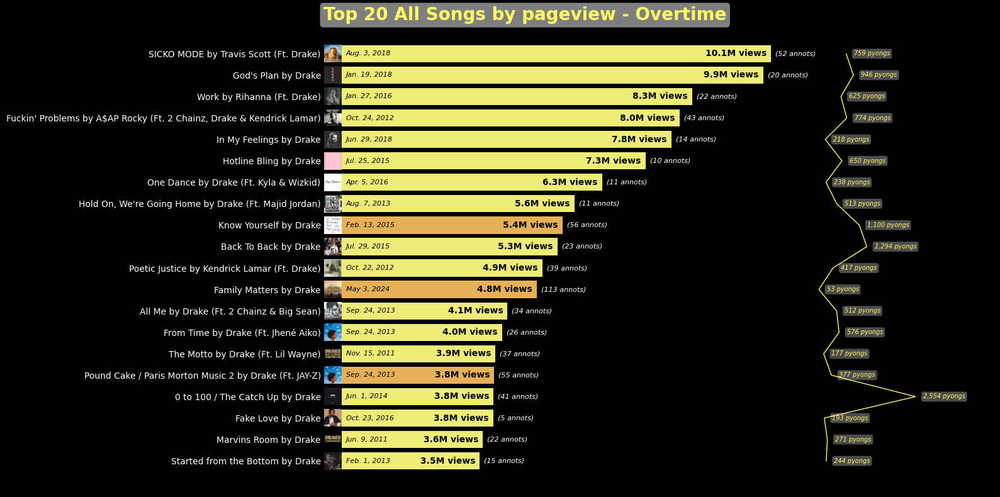

In [1046]:
total_song_agg = all_song_with_thumbnail_df[["full_title","stats.pageviews","release_date_with_abbreviated_month_for_display","song_thumbnail_local_path","annotation_count","pyongs_count","year"]].sort_values(by="stats.pageviews",ascending=False)

top3 = total_song_agg.head(20).nlargest(3,"annotation_count")
colors = [
    "#fdb73e" if full_title in top3["full_title"].values else "#ffff64"
    for full_title in total_song_agg["full_title"].head(20)
]

fig, ax = plt.subplots(figsize=(16,8), facecolor="black")
ax.set_facecolor("black")
ax = sns.barplot(data=total_song_agg.head(20), y="full_title", x=(total_song_agg["stats.pageviews"]).head(20), dodge=False, palette=colors)
ax2 = ax.twiny()
ax2.plot(total_song_agg["pyongs_count"].head(20), range(len(total_song_agg.head(20))), color="#ffff64", linewidth=1)

for i, path in enumerate(total_song_agg["song_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((20,20), Image.LANCZOS)  
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(0, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")

for i, (pageviews, release_date, annotation_count) in enumerate(zip(total_song_agg["stats.pageviews"].head(20), total_song_agg["release_date_with_abbreviated_month_for_display"].head(20), total_song_agg["annotation_count"].head(20))):
    ax.text(pageviews-100_000, i, format_kmb(pageviews) + " views", va="center", fontsize=10, ha="right", color="black", fontweight = "bold")
    ax.text(pageviews+100_000, i, "(" + f"{annotation_count:,.0f}" + " annots)", va="center", ha="left", fontsize=8, color="white", fontstyle= 'italic')
    ax.text(500_000, i, release_date, va="center", ha="left", fontsize=8, color="black", fontstyle= 'italic')

for i, pyongs_count in enumerate(total_song_agg["pyongs_count"].head(20)):
    ax2.text(pyongs_count+200, i, f"{pyongs_count:,.0f} pyongs", va="center", ha="left", fontsize=7, color="#ffff64", fontstyle= 'italic', bbox=dict(facecolor='white', alpha=0.3, boxstyle='round,pad=0.3', linewidth=0))

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', labelsize=10, length=0, colors="white")
ax.tick_params(axis='x', bottom=False, labelbottom=False)
ax.grid(False)
ax.set_xlim(0,total_song_agg["stats.pageviews"].head(20).max() * 1.5)

ax2.set_xlim(total_song_agg["pyongs_count"].head(20).max() * -5, total_song_agg["pyongs_count"].head(20).max() * 1.8)
ax2.set_xticks([])

plt.title("Top 20 All Songs by pageview - Overtime", fontweight="bold", color="#ffff64", fontsize=20, pad=0, bbox=dict(facecolor="white", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0), x=0.3)
sns.despine(bottom = True, left = True)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VII.3.1. Top 20 All Songs by Pageview.png", bbox_inches="tight")
plt.show()

### **VII.3.2. [WORDCLOUD] Top All Songs by Pageview**

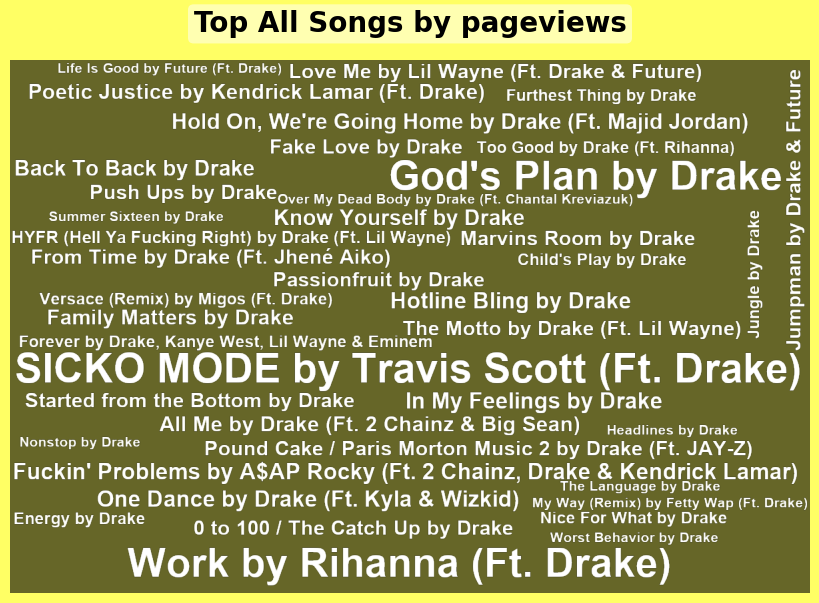

In [1047]:
total_song_freq = dict(sorted(zip(total_song_agg["full_title"].head(100), total_song_agg["stats.pageviews"].head(100)), key=lambda x: x[1], reverse=True))

wc = WordCloud(
    width=1200,
    height=800,
    background_color=None,
    mode="RGBA",
    prefer_horizontal=0.9,
    min_font_size=20,
    max_font_size=220,
    color_func=lambda *args, **kwargs: "white",
    font_path="/System/Library/Fonts/Supplemental/Arial Bold.ttf",
    relative_scaling=0,        
    random_state=100
).generate_from_frequencies(total_song_freq)

fig, ax = plt.subplots(figsize=(8,6), facecolor="#ffff64")
ax.imshow([[(0/255,0/255,0/255,0.6)]], extent=[0,1200,0,8020])
ax.imshow(wc, interpolation="bilinear")
ax.axis("off")
plt.title("Top All Songs by pageviews", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="white", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout(pad=0)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VII.3.2. WORDCLOUD Top All Songs by Pageview.png", bbox_inches="tight")
plt.show()

### **VII.3.3. [TREEMAP] Top All Songs by Pageview**

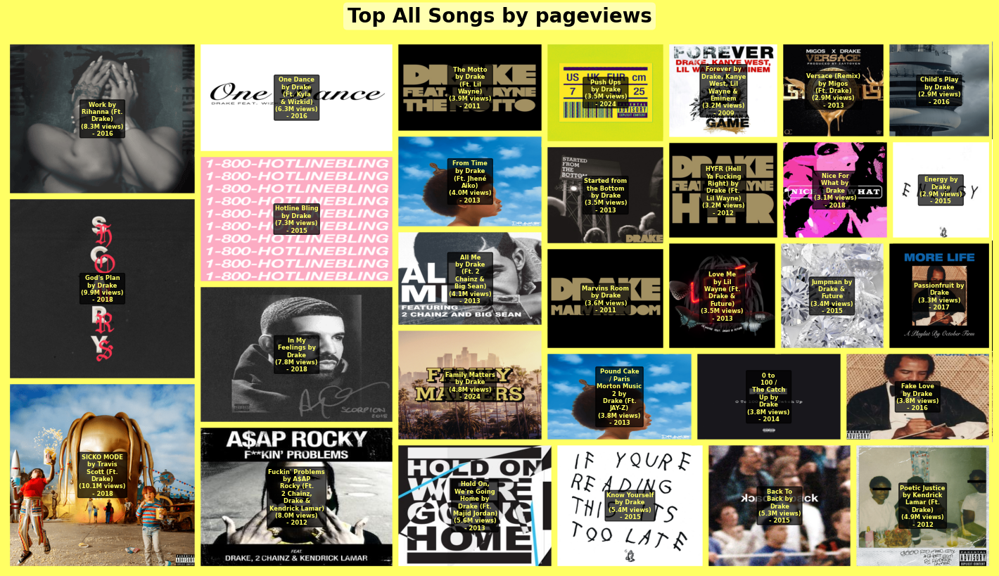

In [1048]:
def format_text(text: str) -> str:
    words = text.split()
    if len(words) < 3:
        return text
    return "\n".join([" ".join(words[i:i+2]) for i in range(0, len(words), 2)])

sizes = total_song_agg["stats.pageviews"].head(30).tolist()
labels = (total_song_agg["full_title"].apply(format_text) + "\n(" + total_song_agg["stats.pageviews"].apply(format_kmb) + " views)\n- " + total_song_agg["year"].astype(str)).head(30).tolist()
paths = total_song_agg["song_thumbnail_local_path"].head(30).tolist()

# Normalize sizes to fit the 1200 x 800 frame.
# The treemap needs a total area equal to width*height.
# "normalize_sizes" function rescales sizes to this frame.
normed_sizes = squarify.normalize_sizes(sizes, 1200, 800)
rects = squarify.squarify(normed_sizes, 0, 0, 1200, 800)            # Create a list of coordinates of treemap rectangles




fig, ax = plt.subplots(figsize=(14,8), facecolor="#ffff64")
ax.axis("off")

for rect, label, path, size in zip(rects, labels, paths, sizes):
    x, y, w, h = rect["x"], rect["y"], rect["dx"], rect["dy"]           # Get x, y, w, h information: coordinates (x, y) lower left corner and dimensions w=dx, h=dy.
    try:
        img = mpimg.imread(path)
        ax.imshow(img, extent=[x, x+w, y, y+h], aspect="auto", zorder=0)

        ax.plot([x, x+w, x+w, x, x], [y, y, y+h, y+h, y], color="#ffff64", lw=6)

        ax.text(x + w/2, y + h/2, label, ha="center", va="center", color="#ffff64", fontsize=6, weight="bold", bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.2"))

    except Exception as e:
        print(f"Error loading {label}: {e}")

plt.title("Top All Songs by pageviews", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="white", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout(pad=0)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VII.3.3. TREEMAP Top All Songs by Pageview.png", bbox_inches="tight")
plt.show()


## **VII.4. TOP ALL SONGs by ANNOTATIONs - OVERTIME**

/var/folders/7q/sfnchm8d521c9vslcz802kw80000gn/T/ipykernel_96145/2995628059.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=total_song_agg.head(20), y="full_title", x=(total_song_agg["annotation_count"]).head(20), dodge=False, palette=colors)


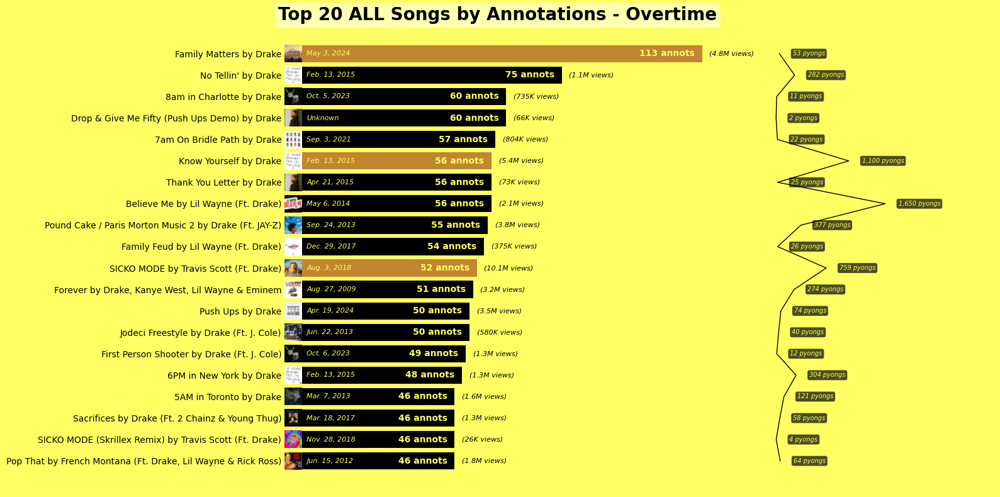

In [1049]:
total_song_agg = all_song_with_thumbnail_df[["full_title","stats.pageviews","release_date_with_abbreviated_month_for_display","song_thumbnail_local_path","annotation_count","pyongs_count","year"]].sort_values(by="annotation_count",ascending=False)

top3 = total_song_agg.head(20).nlargest(3,"stats.pageviews")
colors = [
    "#d98b19" if full_title in top3["full_title"].values else "black"
    for full_title in total_song_agg["full_title"].head(20)
]

fig, ax = plt.subplots(figsize=(16,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
ax = sns.barplot(data=total_song_agg.head(20), y="full_title", x=(total_song_agg["annotation_count"]).head(20), dodge=False, palette=colors)
ax2 = ax.twiny()
ax2.plot(total_song_agg["pyongs_count"].head(20), range(len(total_song_agg.head(20))), color="black", linewidth=1)

for i, path in enumerate(total_song_agg["song_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((20,20), Image.LANCZOS)  
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(0, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")
            
for i, (annotation_count, release_date, pageviews) in enumerate(zip(total_song_agg["annotation_count"].head(20), total_song_agg["release_date_with_abbreviated_month_for_display"].head(20), total_song_agg["stats.pageviews"].head(20))):
    ax.text(annotation_count-2, i, format_kmb(annotation_count) + " annots", va="center", fontsize=10, ha="right", color="#ffff64", fontweight = "bold")
    ax.text(annotation_count+2, i, "(" + format_kmb(pageviews) + " views)", va="center", ha="left", fontsize=8, color="black", fontstyle= 'italic')
    ax.text(6, i, release_date, va="center", ha="left", fontsize=8, color="#ffff64", fontstyle= 'italic')

for i, pyongs_count in enumerate(total_song_agg["pyongs_count"].head(20)):
    ax2.text(pyongs_count+200, i, f"{pyongs_count:,.0f} pyongs", va="center", ha="left", fontsize=7, color="#ffff64", fontstyle= 'italic', bbox=dict(facecolor='black', alpha=0.7, boxstyle='round,pad=0.3', linewidth=0))

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', labelsize=10, length=0, colors="black")
ax.tick_params(axis='x', bottom=False, labelbottom=False)
ax.grid(False)
ax.set_xlim(0,total_song_agg["annotation_count"].head(20).max() * 1.7)

ax2.set_xlim(total_song_agg["pyongs_count"].head(20).max() * -4.5, total_song_agg["pyongs_count"].head(20).max() * 2)
ax2.set_xticks([])

plt.title("Top 20 ALL Songs by Annotations - Overtime", fontweight="bold", color="black", fontsize=20, pad=0, bbox=dict(facecolor="white", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0), x=0.3)
sns.despine(bottom = True, left = True)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VII.4. TOP ALL SONGs by ANNOTATIONs - OVERTIME.png", bbox_inches="tight")
plt.show()

---
# **VIII. SONGs as PRIMARY ARTIST**

## **VIII.1. Songs as primary artist - BY YEAR**

/var/folders/7q/sfnchm8d521c9vslcz802kw80000gn/T/ipykernel_96145/3512776731.py:62: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(primary_song_year_agg["year"], fontsize=10, fontweight="bold", color="#ffff64", y=-0.01)


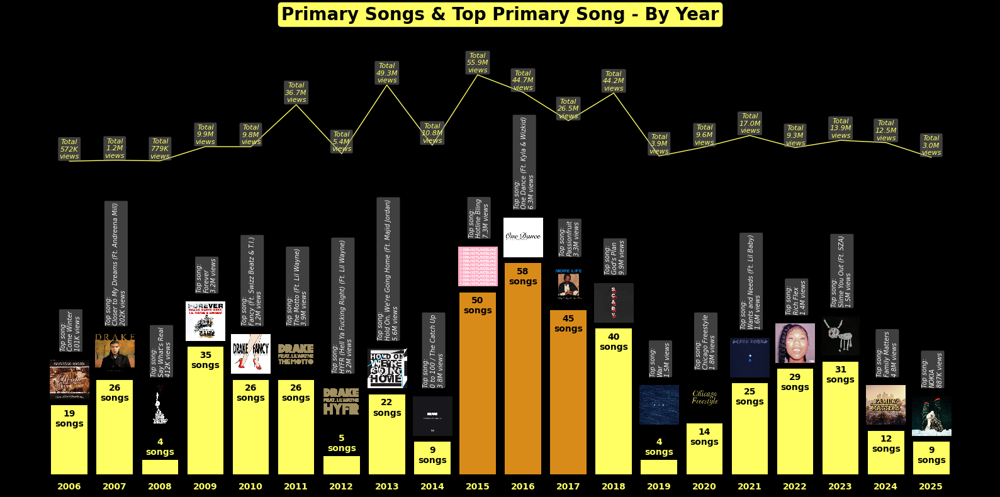

In [1050]:
primary_song_year_agg = (
    all_song_with_thumbnail_df[all_song_with_thumbnail_df["primary_artist.id"] == 130]
    .sort_values("release_date_for_display")
    .groupby("year")
    .agg(count_track=("release_date_for_display", "count"), sum_pageviews=("stats.pageviews","sum"))
    .reset_index()
)
primary_song_year_agg_song = (
    all_song_with_thumbnail_df[all_song_with_thumbnail_df["primary_artist.id"] == 130]
    .sort_values("release_date_for_display")
    .groupby(["year","title_with_featured","song_thumbnail_local_path"])
    .agg(sum_pageviews=("stats.pageviews", "sum"))
    .reset_index()
)
top_primary_song_year = (
    primary_song_year_agg_song
    .sort_values(["year", "sum_pageviews"], ascending=[True, False])
    .drop_duplicates("year")
    .rename(columns={"title_with_featured": "top_song","sum_pageviews":"top_song_pageview"})
)
primary_song_year_agg = primary_song_year_agg.merge(top_primary_song_year, on="year", how="left")
primary_song_year_agg["top_song"] = "Top song:\n" + primary_song_year_agg["top_song"] + "\n" + primary_song_year_agg["top_song_pageview"].apply(format_kmb) + " views"
primary_song_year_agg["year"] = primary_song_year_agg["year"].astype(str)

top3_year = primary_song_year_agg.nlargest(3,"count_track")
colors = [
    "#d98b19" if year in top3_year["year"].values else "#ffff64"
    for year in primary_song_year_agg["year"]
]


fig, ax = plt.subplots(figsize=(16,8), facecolor="black")
ax.set_facecolor("black")
bars = plt.bar(primary_song_year_agg["year"], primary_song_year_agg["count_track"], color=colors)

ax2 = ax.twinx()
ax2.plot(primary_song_year_agg["year"], primary_song_year_agg["sum_pageviews"]+200_000_000, color="#ffff64", linewidth=1, label="Total pageviews")

for bar, top_song, song_thumbnail_local_path in zip(bars, primary_song_year_agg["top_song"], primary_song_year_agg["song_thumbnail_local_path"]):
    if bar.get_height() > 8:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()-1, f"{bar.get_height():,.0f}" + "\nsongs", ha='center', va='top', fontsize=10, fontweight="bold", color="black")
        ax.text(bar.get_x() + bar.get_width()/2-0.2, bar.get_height()+15, top_song, ha='left', va='bottom', fontsize=7, fontstyle="italic", rotation=90, color="white", bbox=dict(facecolor="gray", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
    else:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()+1, f"{bar.get_height():,.0f}" + "\nsongs", ha='center', va='bottom', fontsize=10, fontweight="bold", color="#ffff64")
        ax.text(bar.get_x() + bar.get_width()/2-0.2, bar.get_height()+23, top_song, ha='left', va='bottom', fontsize=7, fontstyle="italic", rotation=90, color="white", bbox=dict(facecolor="gray", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
        
    if song_thumbnail_local_path and os.path.exists(song_thumbnail_local_path):
        try:
            img = mpimg.imread(song_thumbnail_local_path)
            imagebox = OffsetImage(img, zoom=0.15)
            if bar.get_height() > 8:
                ab = AnnotationBbox(imagebox, (bar.get_x() + bar.get_width()/2, bar.get_height()+7), frameon=False)
            else:
                ab = AnnotationBbox(imagebox, (bar.get_x() + bar.get_width()/2, bar.get_height()+15), frameon=False)
            ax.add_artist(ab)
        except Exception as e:
            print(f"Error loading image {song_thumbnail_local_path}: {e}")

for i, sum_pageviews in enumerate(primary_song_year_agg["sum_pageviews"]+200_000_000):
    ax2.text(i, sum_pageviews+max(primary_song_year_agg["sum_pageviews"])*0.02, "Total\n" + format_kmb(sum_pageviews-200_000_000) + "\nviews", ha="center", va="bottom", fontsize=8, color="#ffff64", fontstyle="italic", bbox=dict(facecolor="gray", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))

ax.set_xticklabels(primary_song_year_agg["year"], fontsize=10, fontweight="bold", color="#ffff64", y=-0.01)
ax.set_yticklabels([])
ax.tick_params(axis='both', length=0)
ax.set_ylim(0,120)

ax2.tick_params(axis='both', length=0)
ax2.set_yticklabels([])
ax2.set_ylim(0,80_000_000+200_000_000)

plt.title("Primary Songs & Top Primary Song - By Year", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="#ffff64", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout()
sns.despine(bottom = True, left = True)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VIII.1. Songs as primary artist BY YEAR.png", bbox_inches="tight")
plt.show()

## **VIII.2. Songs as primary artist - BY MONTH**

### **VIII.2.1 Songs as primary artist - BY MONTH**

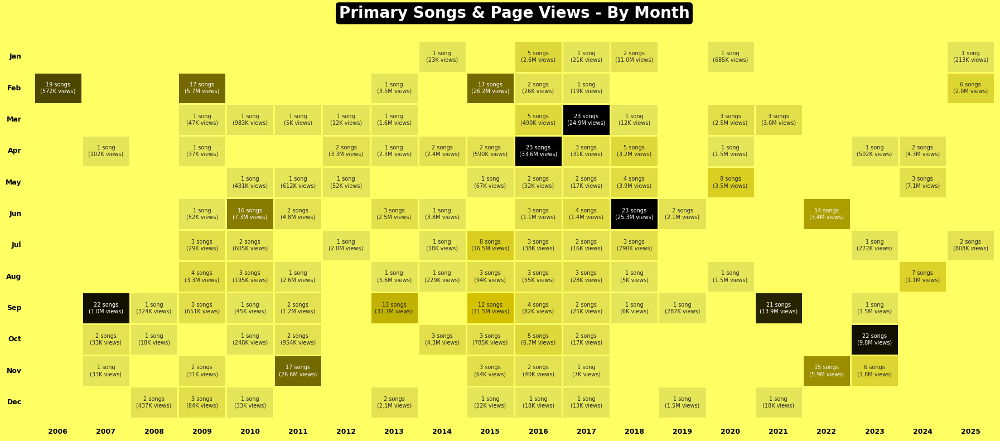

In [1051]:
primary_song_pivot_track = all_song_with_thumbnail_df[all_song_with_thumbnail_df["primary_artist.id"] == 130] \
.pivot_table(
    index="month_number",
    columns="year",
    values="release_date_for_display",
    aggfunc="count",
    fill_value=0
)

primary_song_pivot_pageviews = all_song_with_thumbnail_df[all_song_with_thumbnail_df["primary_artist.id"] == 130] \
.pivot_table(    
    index="month_number",
    columns="year",
    values="stats.pageviews",
    aggfunc="sum",
    fill_value=0
)

month_order = all_song_with_thumbnail_df[["month_number","month"]].drop_duplicates().dropna(subset=["month"]).sort_values("month_number")["month"].values
primary_song_pivot_track.index = month_order
primary_song_pivot_pageviews.index = month_order
mask = primary_song_pivot_track == 0

annot = primary_song_pivot_track.map(lambda x: f"{x:,.0f} song" if x == 1 else (f"{x:,.0f} songs" if x > 1 else "")) + "\n" + primary_song_pivot_pageviews.map(lambda x: f"({format_kmb(x)} views)" if x != 0 else "")

cmap = mcolors.LinearSegmentedColormap.from_list("custom", [(0, "#e5e55a"), (0.5, "#d4c200"), (1, "black")])

fig, ax = plt.subplots(figsize=(18,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
sns.heatmap(primary_song_pivot_track, annot=annot, fmt="", cmap=cmap, linewidths=1, linecolor="#ffff64", cbar=False, mask=mask, annot_kws={"fontsize":7})
plt.title("Primary Songs & Page Views - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="black", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.yticks(rotation=0, fontsize=9, fontweight="bold", color="black", x=-0.01)
plt.xticks(rotation=0, fontsize=9, fontweight="bold", color="black", y=-0.02)
plt.xlabel("")
plt.tick_params(axis='both', length=0)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VIII.2.1 Songs as primary artist BY MONTH.png", bbox_inches="tight")
plt.show()

### **VIII.2.2. Top songs as primary artist by pageviews - BY MONTH**

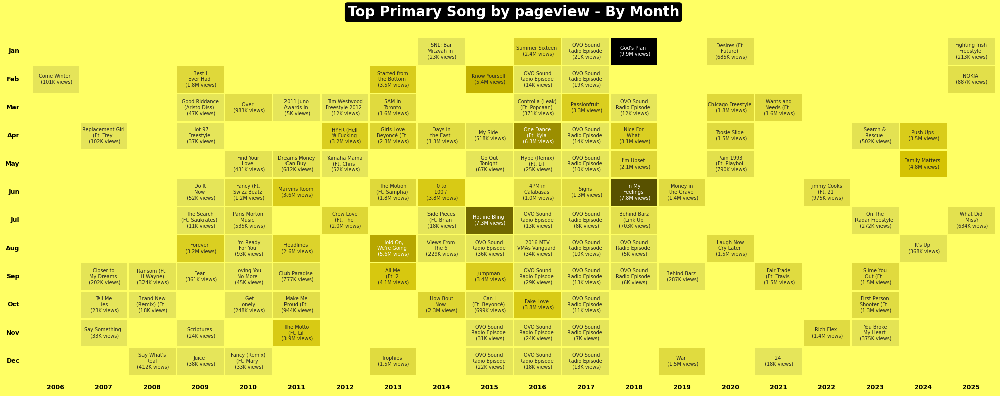

In [1052]:
primary_song_month_agg = (
    all_song_with_thumbnail_df[all_song_with_thumbnail_df["primary_artist.id"] == 130]
    .groupby(["year", "month_number", "title_with_featured", "id"])
    .agg(sum_pageview=("stats.pageviews", "sum"))
    .reset_index()
)
primary_song_month_agg_top = (
    primary_song_month_agg
    .sort_values(["year", "month_number", "sum_pageview"], ascending=[True, True, False])
    .drop_duplicates(subset=["year", "month_number"])
)
primary_song_month_agg_top_pivot = primary_song_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="title_with_featured"
)
primary_song_month_agg_top_pivot_pageview = primary_song_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="sum_pageview"
)

def shorten_text(text):
    words = str(text).split()
    words = words[:4]
    if len(words) > 2:
        return " ".join(words[:2]) + "\n" + " ".join(words[2:])
    else:
        return " ".join(words)

annot = (primary_song_month_agg_top_pivot.stack()
    .astype(str)
    .to_frame("title_with_featured")
    .assign(title_with_featured=lambda df: df["title_with_featured"].apply(shorten_text))
    .join(primary_song_month_agg_top_pivot_pageview.stack().to_frame("sum_pageview"))
    .apply(lambda row: f"{row['title_with_featured']} \n ({format_kmb(row['sum_pageview'])} views)", axis=1)
    .unstack()
)

primary_song_month_agg_top_pivot_pageview.index = month_order
annot.index = month_order
cmap = mcolors.LinearSegmentedColormap.from_list("custom", [(0, "#e5e55a"), (0.5, "#d4c200"), (1, "black")])

fig, ax = plt.subplots(figsize=(20,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
sns.heatmap(primary_song_month_agg_top_pivot_pageview, annot=annot, fmt="", cmap=cmap, linewidths=1, linecolor="#ffff64", cbar=False, mask=primary_song_month_agg_top_pivot_pageview.isna(), annot_kws={"fontsize":7})
plt.title("Top Primary Song by pageview - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="black", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.yticks(rotation=0, fontsize=9, fontweight="bold", color="black", x=-0.01)
plt.xticks(rotation=0, fontsize=9, fontweight="bold", color="black", y=-0.02)
plt.xlabel("")
plt.tick_params(axis='both', length=0)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VIII.2.2. Top songs as primary artist by pageviews BY MONTH.png", bbox_inches="tight")
plt.show()

### **VIII.2.3. [THUMBNAIL] Top songs as primary artist by pageviews - BY MONTH**

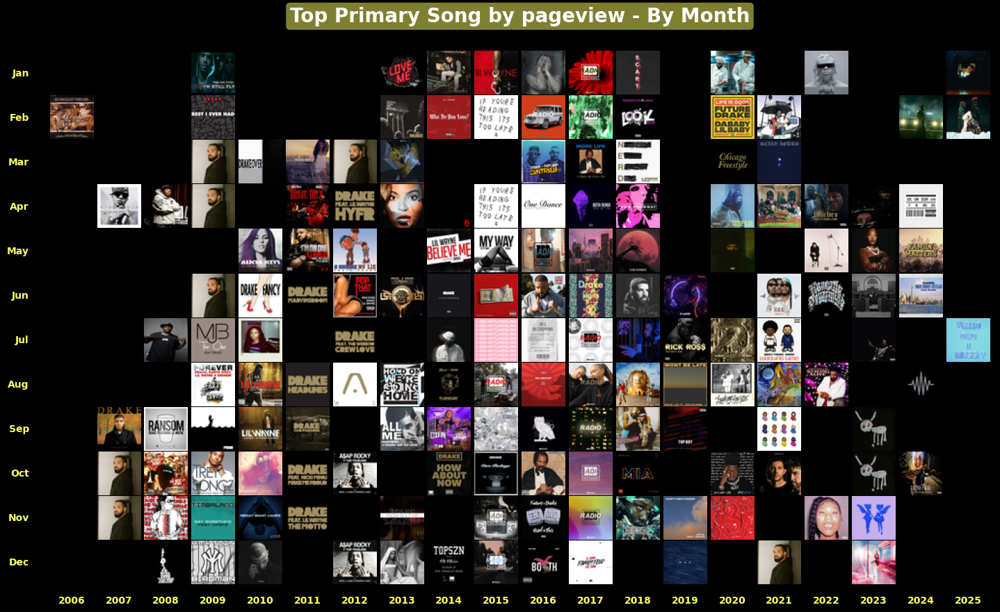

In [1053]:
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

song_to_img_path = dict(zip(all_song_with_thumbnail_df['id'], all_song_with_thumbnail_df['song_thumbnail_local_path']))

primary_song_month_agg = (
    all_song_with_thumbnail_df[all_song_with_thumbnail_df["primary_artist.id"] == 130]
    .groupby(["year", "month_number", "id"])
    .agg(sum_pageview=("stats.pageviews", "sum"))
    .reset_index()
)
primary_song_month_agg_top = (
    total_song_month_agg
    .sort_values(["year", "month_number", "sum_pageview"], ascending=[True, True, False])
    .drop_duplicates(subset=["year", "month_number"])
)
primary_song_month_agg_top_pivot = primary_song_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="id"
).sort_index()

fig, ax = plt.subplots(figsize=(14.5,8.9), facecolor="black")
ax.axis('off')

# Calculate cell dimensions
n_rows = len(primary_song_month_agg_top_pivot)
n_cols = len(primary_song_month_agg_top_pivot.columns)
cell_width = 1.0 / n_cols
cell_height = 1.0 / n_rows

# Iterate through each cell in the pivot table
for i, (month_num, row) in enumerate(primary_song_month_agg_top_pivot.iterrows()):
    for j, year in enumerate(primary_song_month_agg_top_pivot.columns):
        song_id = row[year]
        img_path = song_to_img_path.get(song_id)
        if img_path and pd.notna(img_path):
            try:
                img = Image.open(img_path).convert("RGBA")
                img = img.resize((45,45), Image.LANCZOS)  
                img_array = np.array(img)

                x = j * cell_width + cell_width/2
                y = 1 - (i * cell_height + cell_height/2)

                imagebox = OffsetImage(img_array, zoom=1)
                ab = AnnotationBbox(imagebox, (x, y), frameon=False)
                ax.add_artist(ab)
            except Exception as e:
                print(f"Error loading image for {song_id} from {img_path}: {e}")

# Add column headers (years) at the bottom
for j, year in enumerate(primary_song_month_agg_top_pivot.columns):
    x = j * cell_width + cell_width/2
    y = -0.02
    ax.text(x, y, str(year), ha='center', va='top', fontsize=10, weight='bold', color="#ffff64")

# Add row headers (month names) on the left
for i, month_num in enumerate(primary_song_month_agg_top_pivot.index):
    x = -0.02
    y = 1 - (i * cell_height + cell_height/2)
    month_num = int(month_num) if pd.notna(month_num) else 0
    month_name = month_names[month_num-1] if 1 <= month_num <= 12 else f"Month {month_num}"
    ax.text(x, y, month_name, ha='right', va='center', fontsize=10, weight='bold', color="#ffff64")

plt.title("Top Primary Song by pageview - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="#ffff64", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VIII.2.3. THUMBNAIL Top songs as primary artist by pageviews BY MONTH.png", bbox_inches="tight")
plt.show()

## **VIII.3. TOP SONGs as primary artist by Pageview - OVERTIME**

### **VIII.3.1. Top 20 Songs as primary artist by Pageview**

/var/folders/7q/sfnchm8d521c9vslcz802kw80000gn/T/ipykernel_96145/3293488412.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=primary_song_agg.head(20), y="title_with_featured", x=(primary_song_agg["stats.pageviews"]).head(20), dodge=False, palette=colors)


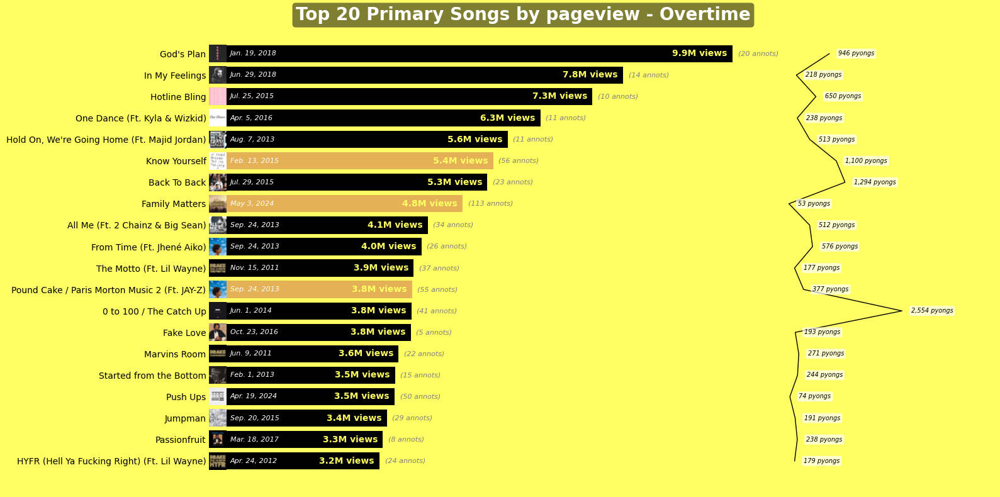

In [1054]:
primary_song_agg = all_song_with_thumbnail_df[all_song_with_thumbnail_df["primary_artist.id"] == 130] \
    [["title_with_featured","stats.pageviews","release_date_with_abbreviated_month_for_display","song_thumbnail_local_path","annotation_count","pyongs_count","year"]] \
    .sort_values(by="stats.pageviews",ascending=False)

top3 = primary_song_agg.head(20).nlargest(3,"annotation_count")
colors = [
    "#fdb73e" if title_with_featured in top3["title_with_featured"].values else "black"
    for title_with_featured in primary_song_agg["title_with_featured"].head(20)
]

fig, ax = plt.subplots(figsize=(16,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
ax = sns.barplot(data=primary_song_agg.head(20), y="title_with_featured", x=(primary_song_agg["stats.pageviews"]).head(20), dodge=False, palette=colors)
ax2 = ax.twiny()
ax2.plot(primary_song_agg["pyongs_count"].head(20), range(len(primary_song_agg.head(20))), color="black", linewidth=1)

for i, path in enumerate(primary_song_agg["song_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((20,20), Image.LANCZOS)
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(0, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")

for i, (pageviews, release_date, annotation_count) in enumerate(zip(primary_song_agg["stats.pageviews"].head(20), primary_song_agg["release_date_with_abbreviated_month_for_display"].head(20), primary_song_agg["annotation_count"].head(20))):
    ax.text(pageviews-100_000, i, format_kmb(pageviews) + " views", va="center", fontsize=10, ha="right", color="#ffff64", fontweight = "bold")
    ax.text(pageviews+100_000, i, "(" + f"{annotation_count:,.0f}" + " annots)", va="center", ha="left", fontsize=8, color="gray", fontstyle= 'italic')
    ax.text(400_000, i, release_date, va="center", ha="left", fontsize=8, color="white", fontstyle= 'italic')

for i, pyongs_count in enumerate(primary_song_agg["pyongs_count"].head(20)):
    ax2.text(pyongs_count+200, i, f"{pyongs_count:,.0f} pyongs", va="center", ha="left", fontsize=7, color="black", fontstyle= 'italic', bbox=dict(facecolor='white', alpha=0.7, boxstyle='round,pad=0.3', linewidth=0))

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', labelsize=10, length=0, colors="black")
ax.tick_params(axis='x', bottom=False, labelbottom=False)
ax.grid(False)
ax.set_xlim(0,primary_song_agg["stats.pageviews"].head(20).max() * 1.5)

ax2.set_xlim(primary_song_agg["pyongs_count"].head(20).max() * -5, primary_song_agg["pyongs_count"].head(20).max() * 1.8)
ax2.set_xticks([])

plt.title("Top 20 Primary Songs by pageview - Overtime", fontweight="bold", color="white", fontsize=20, pad=0, bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0), x=0.4)
sns.despine(bottom = True, left = True)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VIII.3.1. Top 20 Songs as primary artist by Pageview.png", bbox_inches="tight")
plt.show()

### **VIII.3.2. [WORDCLOUD] Top Songs as primary artist by Pageview**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.4..1.4784313725490197].


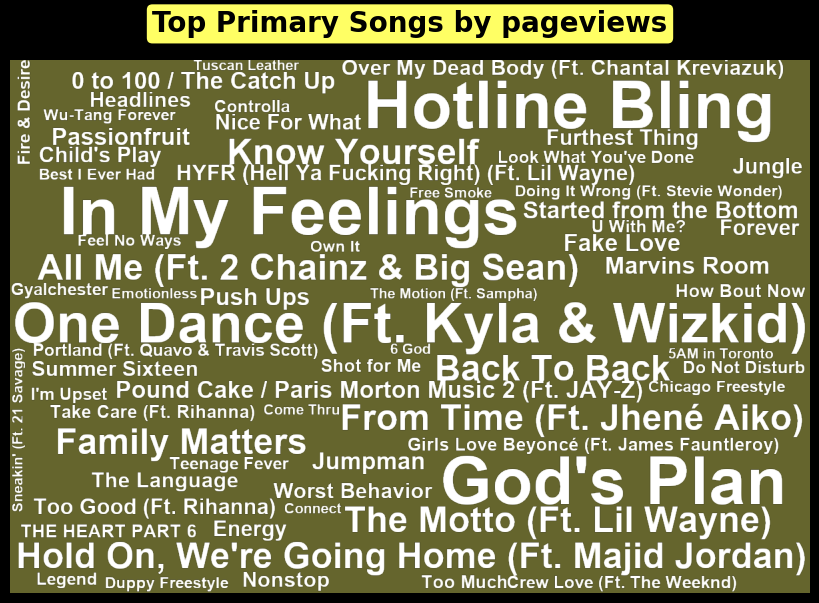

In [1055]:
primary_song_freq = dict(sorted(zip(primary_song_agg["title_with_featured"].head(100), primary_song_agg["stats.pageviews"].head(100)), key=lambda x: x[1], reverse=True))

wc = WordCloud(
    width=1200,
    height=800,
    background_color=None,
    mode="RGBA",
    prefer_horizontal=0.9,
    min_font_size=20,
    max_font_size=100,
    color_func=lambda *args, **kwargs: "white",
    font_path="/System/Library/Fonts/Supplemental/Arial Bold.ttf",
    relative_scaling=0,        
    # random_state=100
).generate_from_frequencies(primary_song_freq)

fig, ax = plt.subplots(figsize=(8,6), facecolor="black")
ax.imshow([[(377/255,377/255,114/255,0.4)]], extent=[0,1200,0,8020])
ax.imshow(wc, interpolation="bilinear")
ax.axis("off")
plt.title("Top Primary Songs by pageviews", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="#ffff64", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout(pad=0)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VIII.3.2. WORDCLOUD Top Songs as primary artist by Pageview.png", bbox_inches="tight")
plt.show()

### **VIII.3.3. [TREEMAP] Top Songs as primary artist by Pageview**

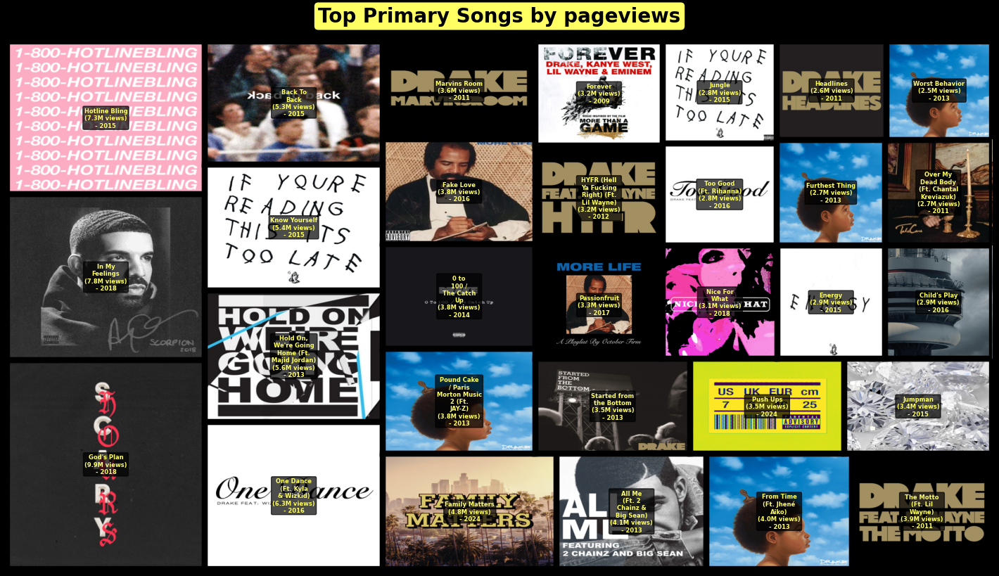

In [1056]:
def format_text(text: str) -> str:
    words = text.split()
    if len(words) < 3:
        return text
    return "\n".join([" ".join(words[i:i+2]) for i in range(0, len(words), 2)])

sizes = primary_song_agg["stats.pageviews"].head(30).tolist()
labels = (primary_song_agg["title_with_featured"].apply(format_text) + "\n(" + primary_song_agg["stats.pageviews"].apply(format_kmb) + " views)\n- " + primary_song_agg["year"].astype(str)).head(30).tolist()
paths = primary_song_agg["song_thumbnail_local_path"].head(30).tolist()

# Normalize sizes to fit the 1200 x 800 frame.
# The treemap needs a total area equal to width*height.
# "normalize_sizes" function rescales sizes to this frame.
normed_sizes = squarify.normalize_sizes(sizes, 1200, 800)
rects = squarify.squarify(normed_sizes, 0, 0, 1200, 800)            # Create a list of coordinates of treemap rectangles

fig, ax = plt.subplots(figsize=(14,8), facecolor="black")
ax.axis("off")

for rect, label, path, size in zip(rects, labels, paths, sizes):
    x, y, w, h = rect["x"], rect["y"], rect["dx"], rect["dy"]           # Get x, y, w, h information: coordinates (x, y) lower left corner and dimensions w=dx, h=dy.
    try:
        img = mpimg.imread(path)
        ax.imshow(img, extent=[x, x+w, y, y+h], aspect="auto", zorder=0)

        ax.plot([x, x+w, x+w, x, x], [y, y, y+h, y+h, y], color="black", lw=6)

        ax.text(x + w/2, y + h/2, label, ha="center", va="center", color="#ffff64", fontsize=6, weight="bold", bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.2"))

    except Exception as e:
        print(f"Error loading {label}: {e}")

plt.title("Top Primary Songs by pageviews", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="#ffff64", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout(pad=0)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VIII.3.3. TREEMAP Top Songs as primary artist by Pageview.png", bbox_inches="tight")
plt.show()


## **VIII.4. TOP SONGs as primary artist by ANNOTATIONs - OVERTIME**

In [ ]:
primary_song_agg = all_song_with_thumbnail_df[all_song_with_thumbnail_df["primary_artist.id"] == 130] \
    [["title_with_featured","stats.pageviews","release_date_with_abbreviated_month_for_display","song_thumbnail_local_path","annotation_count","pyongs_count","year"]] \
    .sort_values(by="annotation_count",ascending=False)

top3 = primary_song_agg.head(20).nlargest(3,"stats.pageviews")
colors = [
    "#d98b19" if title_with_featured in top3["title_with_featured"].values else "#ffff64"
    for title_with_featured in primary_song_agg["title_with_featured"].head(20)
]

fig, ax = plt.subplots(figsize=(16,8), facecolor="black")
ax.set_facecolor("black")
ax = sns.barplot(data=primary_song_agg.head(20), y="title_with_featured", x=(primary_song_agg["annotation_count"]).head(20), dodge=False, palette=colors)
ax2 = ax.twiny()
ax2.plot(primary_song_agg["pyongs_count"].head(20), range(len(primary_song_agg.head(20))), color="#ffff64", linewidth=1)

for i, path in enumerate(primary_song_agg["song_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((20,20), Image.LANCZOS)  
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(0, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")
            
for i, (annotation_count, release_date, pageviews) in enumerate(zip(primary_song_agg["annotation_count"].head(20), primary_song_agg["release_date_with_abbreviated_month_for_display"].head(20), primary_song_agg["stats.pageviews"].head(20))):
    ax.text(annotation_count-1, i, format_kmb(annotation_count) + " annots", va="center", fontsize=10, ha="right", color="black", fontweight = "bold")
    ax.text(annotation_count+1, i, "(" + format_kmb(pageviews) + " views)", va="center", ha="left", fontsize=8, color="gray", fontstyle= 'italic')
    ax.text(5, i, release_date, va="center", ha="left", fontsize=8, color="black", fontstyle= 'italic')

for i, pyongs_count in enumerate(primary_song_agg["pyongs_count"].head(20)):
    ax2.text(pyongs_count+100, i, f"{pyongs_count:,.0f} pyongs", va="center", ha="left", fontsize=7, color="black", fontstyle= 'italic', bbox=dict(facecolor='#ffff64', alpha=0.5, boxstyle='round,pad=0.3', linewidth=0))

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', labelsize=10, length=0, colors="white")
ax.tick_params(axis='x', bottom=False, labelbottom=False)
ax.grid(False)
ax.set_xlim(0,primary_song_agg["annotation_count"].head(20).max() * 1.7)

ax2.set_xlim(primary_song_agg["pyongs_count"].head(20).max() * -4.5, primary_song_agg["pyongs_count"].head(20).max() * 2)
ax2.set_xticks([])

plt.title("Top 20 Primary Songs by Annotations - Overtime", fontweight="bold", color="black", fontsize=20, pad=0, bbox=dict(facecolor="#ffff64", alpha=1, boxstyle="round,pad=0.2", linewidth=0), x=0.3)
sns.despine(bottom = True, left = True)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/VIII.4. TOP SONGs as primary artist by ANNOTATIONs OVERTIME.png", bbox_inches="tight")
plt.show()

---
# **IX. SONGs as FEATURED ARTIST**

## **IX.1. Songs as featured artist - BY YEAR**

/var/folders/7q/sfnchm8d521c9vslcz802kw80000gn/T/ipykernel_96145/2069861573.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(featured_song_year_agg["year"], fontsize=10, fontweight="bold", y=-0.01)


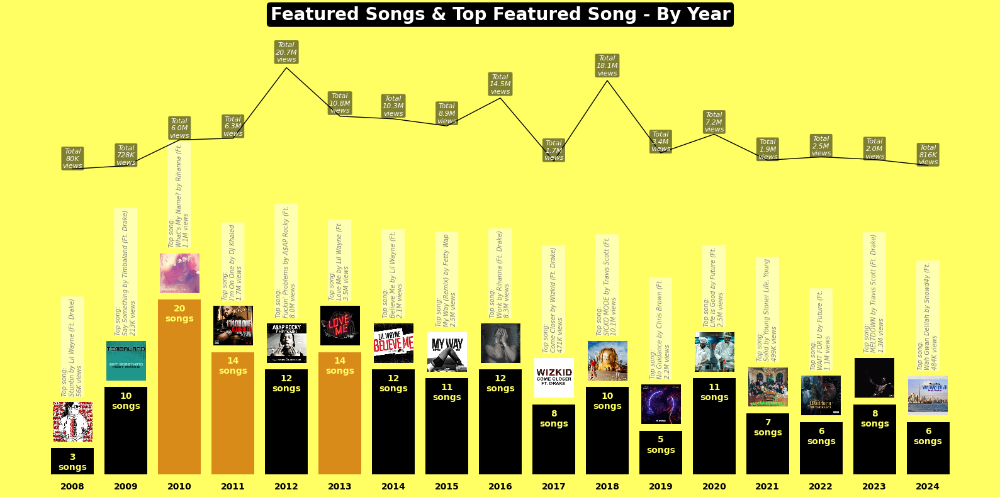

In [1058]:
featured_song_year_agg = (
    all_song_with_thumbnail_df[all_song_with_thumbnail_df["featured_artists_id"] == 130]
    .sort_values("release_date_for_display")
    .groupby("year")
    .agg(count_track=("release_date_for_display", "count"), sum_pageviews=("stats.pageviews","sum"))
    .reset_index()
)
featured_song_year_agg_song = (
    all_song_with_thumbnail_df[all_song_with_thumbnail_df["featured_artists_id"] == 130]
    .sort_values("release_date_for_display")
    .groupby(["year","full_title","song_thumbnail_local_path"])
    .agg(sum_pageviews=("stats.pageviews", "sum"))
    .reset_index()
)
top_featured_song_year = (
    featured_song_year_agg_song
    .sort_values(["year", "sum_pageviews"], ascending=[True, False])
    .drop_duplicates("year")
    .rename(columns={"full_title": "top_song","sum_pageviews":"top_song_pageview"})
)

def shorten_text(text):
    words = str(text).split()
    words = words[:6]
    if len(words) > 6:
        return " ".join(words[:6]) + "\n" + " ".join(words[6:])
    else:
        return " ".join(words)

featured_song_year_agg = featured_song_year_agg.merge(top_featured_song_year, on="year", how="left")
featured_song_year_agg["top_song"] = "Top song:\n" + featured_song_year_agg["top_song"].apply(shorten_text) + "\n" + featured_song_year_agg["top_song_pageview"].apply(format_kmb) + " views"
featured_song_year_agg["year"] = featured_song_year_agg["year"].astype(str)

top3_year = featured_song_year_agg.nlargest(3,"count_track")
colors = [
    "#d98b19" if year in top3_year["year"].values else "black"
    for year in featured_song_year_agg["year"]
]


fig, ax = plt.subplots(figsize=(16,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
bars = plt.bar(featured_song_year_agg["year"], featured_song_year_agg["count_track"], color=colors)

ax2 = ax.twinx()
ax2.plot(featured_song_year_agg["year"], featured_song_year_agg["sum_pageviews"], color="black", linewidth=1, label="Total pageviews")

for bar, top_song, song_thumbnail_local_path in zip(bars, featured_song_year_agg["top_song"], featured_song_year_agg["song_thumbnail_local_path"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()-0.5, f"{bar.get_height():,.0f}" + "\nsongs", ha='center', va='top', fontsize=10, fontweight="bold", color="#ffff64")
    ax.text(bar.get_x() + bar.get_width()/2-0.2, bar.get_height()+6, top_song, ha='left', va='bottom', fontsize=7, fontstyle="italic", rotation=90, color="gray", bbox=dict(facecolor="white", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
        
    if song_thumbnail_local_path and os.path.exists(song_thumbnail_local_path):
        try:
            img = mpimg.imread(song_thumbnail_local_path)
            imagebox = OffsetImage(img, zoom=0.15)
            ab = AnnotationBbox(imagebox, (bar.get_x() + bar.get_width()/2, bar.get_height()+3), frameon=False)
            ax.add_artist(ab)
        except Exception as e:
            print(f"Error loading image {song_thumbnail_local_path}: {e}")

for i, sum_pageviews in enumerate(featured_song_year_agg["sum_pageviews"]):
    ax2.text(i, sum_pageviews*1.05, "Total\n" + format_kmb(sum_pageviews) + "\nviews", ha="center", va="bottom", fontsize=8, color="white", fontstyle="italic", bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))

ax.set_xticklabels(featured_song_year_agg["year"], fontsize=10, fontweight="bold", y=-0.01)
ax.set_yticklabels([])
ax.tick_params(axis='both', length=0)
ax.set_ylim(0,featured_song_year_agg["count_track"].max()*2.5)

ax2.tick_params(axis='both', length=0)
ax2.set_yticklabels([])
ax2.set_ylim(featured_song_year_agg["sum_pageviews"].max()*-3,featured_song_year_agg["sum_pageviews"].max()*1.3)

plt.title("Featured Songs & Top Featured Song - By Year", fontweight="bold", color="white", fontsize=20, pad=20, bbox=dict(facecolor="black", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout()
sns.despine(bottom = True, left = True)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/IX.1. Songs as featured artist BY YEAR.png", bbox_inches="tight")
plt.show()

## **IX.2. Songs as featured artist - BY MONTH**

### **IX.2.1. Songs as featured artist - BY MONTH**

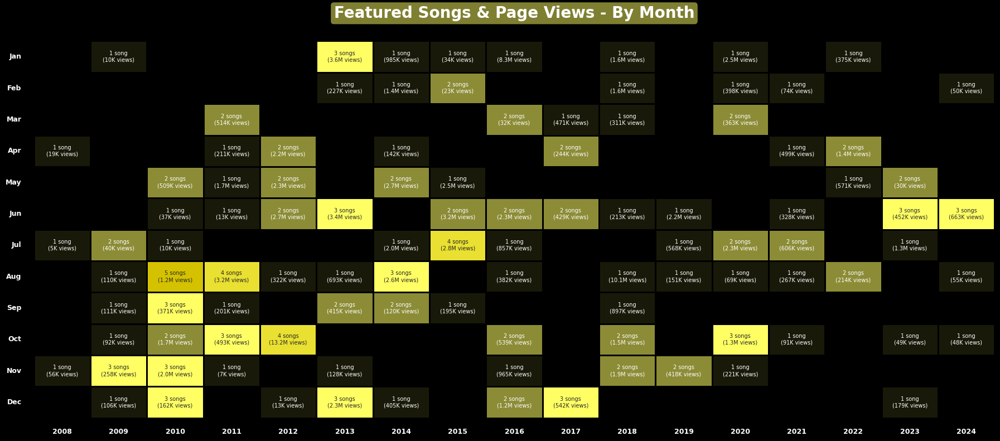

In [1059]:
featured_song_pivot_track = all_song_with_thumbnail_df[all_song_with_thumbnail_df["featured_artists_id"] == 130] \
.pivot_table(
    index="month_number",
    columns="year",
    values="release_date_for_display",
    aggfunc="count",
    fill_value=0
)

featured_song_pivot_pageviews = all_song_with_thumbnail_df[all_song_with_thumbnail_df["featured_artists_id"] == 130] \
.pivot_table(    
    index="month_number",
    columns="year",
    values="stats.pageviews",
    aggfunc="sum",
    fill_value=0
)

month_order = all_song_with_thumbnail_df[["month_number","month"]].drop_duplicates().dropna(subset=["month"]).sort_values("month_number")["month"].values
featured_song_pivot_track.index = month_order
featured_song_pivot_pageviews.index = month_order
mask = featured_song_pivot_track == 0

annot = featured_song_pivot_track.map(lambda x: f"{x:,.0f} song" if x == 1 else (f"{x:,.0f} songs" if x > 1 else "")) + "\n" + featured_song_pivot_pageviews.map(lambda x: f"({format_kmb(x)} views)" if x != 0 else "")

cmap = mcolors.LinearSegmentedColormap.from_list("custom", [(0, "#19190a"), (0.5, "#ffff64"), (1, "#d4c200")])

fig, ax = plt.subplots(figsize=(18,8), facecolor="black")
ax.set_facecolor("black")
sns.heatmap(featured_song_pivot_track, annot=annot, fmt="", cmap=cmap, linewidths=1, linecolor="black", cbar=False, mask=mask, annot_kws={"fontsize":7})
plt.title("Featured Songs & Page Views - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="#ffff64", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.yticks(rotation=0, fontsize=9, fontweight="bold", color="white", x=-0.01)
plt.xticks(rotation=0, fontsize=9, fontweight="bold", color="white", y=-0.02)
plt.xlabel("")
plt.tick_params(axis='both', length=0)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/IX.2.1. Songs as featured artist BY MONTH.png", bbox_inches="tight")
plt.show()

### **IX.2.2. Top Songs as featured artist by pageviews - BY MONTH**

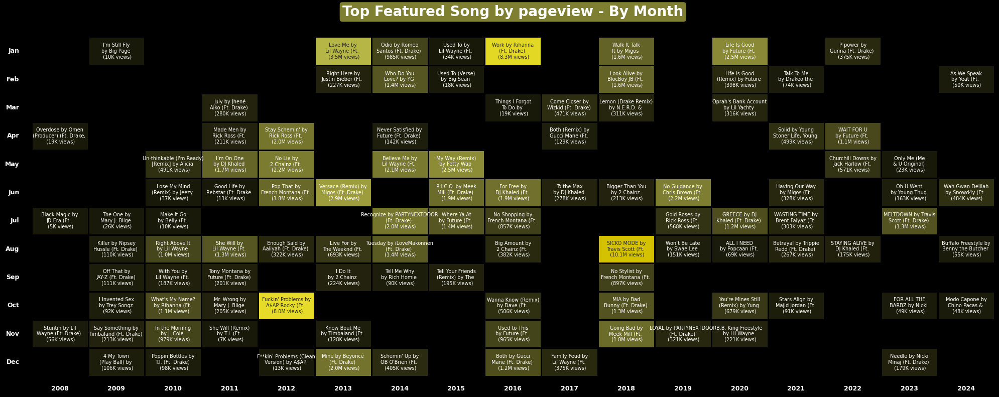

In [1060]:
featured_song_month_agg = (
    all_song_with_thumbnail_df[all_song_with_thumbnail_df["featured_artists_id"] == 130]
    .groupby(["year", "month_number", "full_title", "id"])
    .agg(sum_pageview=("stats.pageviews", "sum"))
    .reset_index()
)
featured_song_month_agg_top = (
    featured_song_month_agg
    .sort_values(["year", "month_number", "sum_pageview"], ascending=[True, True, False])
    .drop_duplicates(subset=["year", "month_number"])
)
featured_song_month_agg_top_pivot = featured_song_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="full_title"
)
featured_song_month_agg_top_pivot_pageview = featured_song_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="sum_pageview"
)

def shorten_text(text):
    words = str(text).split()
    words = words[:6]
    if len(words) > 2:
        return " ".join(words[:3]) + "\n" + " ".join(words[3:])
    else:
        return " ".join(words)

annot = (featured_song_month_agg_top_pivot.stack()
    .astype(str)
    .to_frame("full_title")
    .assign(full_title=lambda df: df["full_title"].apply(shorten_text))
    .join(featured_song_month_agg_top_pivot_pageview.stack().to_frame("sum_pageview"))
    .apply(lambda row: f"{row['full_title']} \n ({format_kmb(row['sum_pageview'])} views)", axis=1)
    .unstack()
)

featured_song_month_agg_top_pivot_pageview.index = month_order
annot.index = month_order
cmap = mcolors.LinearSegmentedColormap.from_list("custom", [(0, "#19190a"), (0.5, "#ffff64"), (1, "#d4c200")])

fig, ax = plt.subplots(figsize=(20,8), facecolor="black")
ax.set_facecolor("black")
sns.heatmap(featured_song_month_agg_top_pivot_pageview, annot=annot, fmt="", cmap=cmap, linewidths=1, linecolor="black", cbar=False, mask=featured_song_month_agg_top_pivot_pageview.isna(), annot_kws={"fontsize":7})
plt.title("Top Featured Song by pageview - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="#ffff64", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.yticks(rotation=0, fontsize=9, fontweight="bold", color="white", x=-0.01)
plt.xticks(rotation=0, fontsize=9, fontweight="bold", color="white", y=-0.02)
plt.xlabel("")
plt.tick_params(axis='both', length=0)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/IX.2.2. Top Songs as featured artist by pageviews BY MONTH.png", bbox_inches="tight")
plt.show()

### **IX.2.3. [THUMBNAIL] Top Songs as featured artist by pageviews - BY MONTH**

In [ ]:
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

song_to_img_path = dict(zip(all_song_with_thumbnail_df['id'], all_song_with_thumbnail_df['song_thumbnail_local_path']))

featured_song_month_agg = (
    all_song_with_thumbnail_df[all_song_with_thumbnail_df["featured_artists_id"] == 130]
    .groupby(["year", "month_number", "id"])
    .agg(sum_pageview=("stats.pageviews", "sum"))
    .reset_index()
)
featured_song_month_agg_top = (
    featured_song_month_agg
    .sort_values(["year", "month_number", "sum_pageview"], ascending=[True, True, False])
    .drop_duplicates(subset=["year", "month_number"])
)
featured_song_month_agg_top_pivot = featured_song_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="id"
).sort_index()

fig, ax = plt.subplots(figsize=(12.8,8.9), facecolor="#ffff64")
ax.axis('off')

# Calculate cell dimensions
n_rows = len(featured_song_month_agg_top_pivot)
n_cols = len(featured_song_month_agg_top_pivot.columns)
cell_width = 1.0 / n_cols
cell_height = 1.0 / n_rows

# Iterate through each cell in the pivot table
for i, (month_num, row) in enumerate(featured_song_month_agg_top_pivot.iterrows()):
    for j, year in enumerate(featured_song_month_agg_top_pivot.columns):
        song_id = row[year]
        img_path = song_to_img_path.get(song_id)
        if img_path and pd.notna(img_path):
            try:
                img = Image.open(img_path).convert("RGBA")
                img = img.resize((45,45), Image.LANCZOS)  
                img_array = np.array(img)

                x = j * cell_width + cell_width/2
                y = 1 - (i * cell_height + cell_height/2)

                imagebox = OffsetImage(img_array, zoom=1)
                ab = AnnotationBbox(imagebox, (x, y), frameon=False)
                ax.add_artist(ab)
            except Exception as e:
                print(f"Error loading image for {song_id} from {img_path}: {e}")

# Add column headers (years) at the bottom
for j, year in enumerate(featured_song_month_agg_top_pivot.columns):
    x = j * cell_width + cell_width/2
    y = -0.02
    ax.text(x, y, str(year), ha='center', va='top', fontsize=10, weight='bold', color="black")

# Add row headers (month names) on the left
for i, month_num in enumerate(featured_song_month_agg_top_pivot.index):
    x = -0.02
    y = 1 - (i * cell_height + cell_height/2)
    month_num = int(month_num) if pd.notna(month_num) else 0
    month_name = month_names[month_num-1] if 1 <= month_num <= 12 else f"Month {month_num}"
    ax.text(x, y, month_name, ha='right', va='center', fontsize=10, weight='bold', color="black")

plt.title("Top Featured Song by pageview - By Month", fontweight="bold", color="white", fontsize=20, pad=20, bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/IX.2.3. THUMBNAIL Top Songs as featured artist by pageviews BY MONTH.png", bbox_inches="tight")
plt.show()

## **IX.3. TOP SONGs as featured artist by Pageview - OVERTIME**

### **IX.3.1. Top 20 Songs as featured artist by Pageview**

/var/folders/7q/sfnchm8d521c9vslcz802kw80000gn/T/ipykernel_96145/558949694.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=featured_song_agg.head(20), y="full_title", x=(featured_song_agg["stats.pageviews"]).head(20), dodge=False, palette=colors)


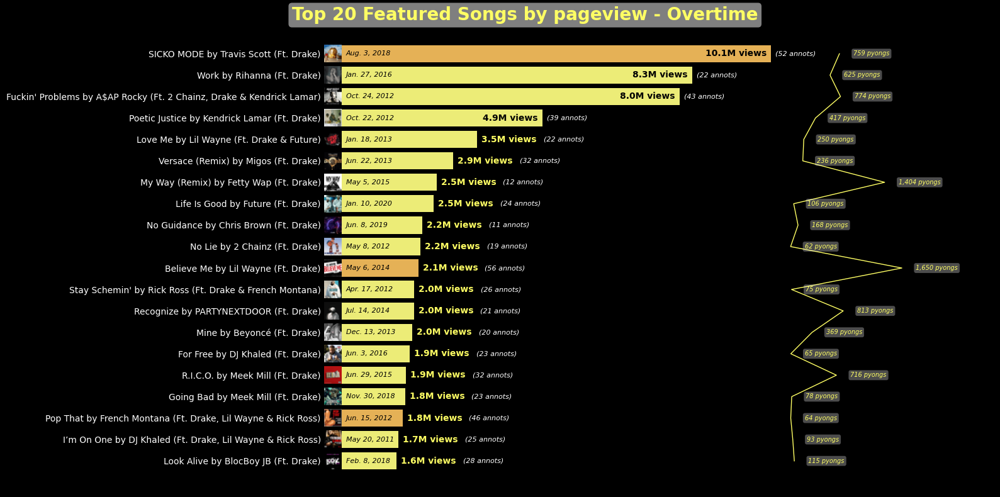

In [1062]:
featured_song_agg = all_song_with_thumbnail_df[all_song_with_thumbnail_df["featured_artists_id"] == 130] \
    [["full_title","stats.pageviews","release_date_with_abbreviated_month_for_display","song_thumbnail_local_path","annotation_count","pyongs_count","year"]] \
    .sort_values(by="stats.pageviews",ascending=False)

top3 = featured_song_agg.head(20).nlargest(3,"annotation_count")
colors = [
    "#fdb73e" if full_title in top3["full_title"].values else "#ffff64"
    for full_title in featured_song_agg["full_title"].head(20)
]

fig, ax = plt.subplots(figsize=(16,8), facecolor="black")
ax.set_facecolor("black")
ax = sns.barplot(data=featured_song_agg.head(20), y="full_title", x=(featured_song_agg["stats.pageviews"]).head(20), dodge=False, palette=colors)
ax2 = ax.twiny()
ax2.plot(featured_song_agg["pyongs_count"].head(20), range(len(featured_song_agg.head(20))), color="#ffff64", linewidth=1)

for i, path in enumerate(featured_song_agg["song_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((20,20), Image.LANCZOS)  
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(0, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")

for i, (pageviews, release_date, annotation_count) in enumerate(zip(featured_song_agg["stats.pageviews"].head(20), featured_song_agg["release_date_with_abbreviated_month_for_display"].head(20), featured_song_agg["annotation_count"].head(20))):
    if pageviews > 4_000_000:
        ax.text(pageviews-100_000, i, format_kmb(pageviews) + " views", va="center", fontsize=10, ha="right", color="black", fontweight = "bold")
        ax.text(pageviews+100_000, i, "(" + f"{annotation_count:,.0f}" + " annots)", va="center", ha="left", fontsize=8, color="white", fontstyle= 'italic')
    else:
        ax.text(pageviews+100_000, i, format_kmb(pageviews) + " views", va="center", fontsize=10, ha="left", color="#ffff64", fontweight = "bold")
        ax.text(pageviews+1_500_000, i, "(" + f"{annotation_count:,.0f}" + " annots)", va="center", ha="left", fontsize=8, color="white", fontstyle= 'italic')
    ax.text(500_000, i, release_date, va="center", ha="left", fontsize=8, color="black", fontstyle= 'italic')

for i, pyongs_count in enumerate(featured_song_agg["pyongs_count"].head(20)):
    ax2.text(pyongs_count+200, i, f"{pyongs_count:,.0f} pyongs", va="center", ha="left", fontsize=7, color="#ffff64", fontstyle= 'italic', bbox=dict(facecolor='white', alpha=0.3, boxstyle='round,pad=0.3', linewidth=0))

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', labelsize=10, length=0, colors="white")
ax.tick_params(axis='x', bottom=False, labelbottom=False)
ax.grid(False)
ax.set_xlim(0,featured_song_agg["stats.pageviews"].head(20).max() * 1.5)

ax2.set_xlim(featured_song_agg["pyongs_count"].head(20).max() * -4, featured_song_agg["pyongs_count"].head(20).max() * 1.8)
ax2.set_xticks([])

plt.title("Top 20 Featured Songs by pageview - Overtime", fontweight="bold", color="#ffff64", fontsize=20, pad=0, bbox=dict(facecolor="white", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0), x=0.3)
sns.despine(bottom = True, left = True)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/IX.3.1. Top 20 Songs as featured artist by Pageview.png", bbox_inches="tight")
plt.show()

### **IX.3.2. [WORDCLOUD] Top Songs as feature artist by Pageview**

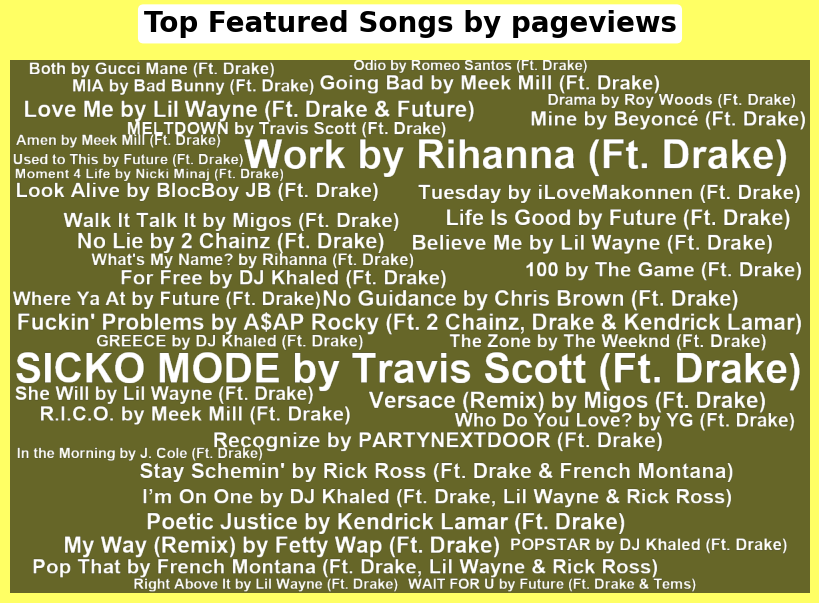

In [1063]:
featured_song_freq = dict(sorted(zip(featured_song_agg["full_title"].head(100), featured_song_agg["stats.pageviews"].head(100)), key=lambda x: x[1], reverse=True))

wc = WordCloud(
    width=1200,
    height=800,
    background_color=None,
    mode="RGBA",
    prefer_horizontal=0.9,
    min_font_size=20,
    max_font_size=220,
    color_func=lambda *args, **kwargs: "white",
    font_path="/System/Library/Fonts/Supplemental/Arial Bold.ttf",
    relative_scaling=0,        
    random_state=100
).generate_from_frequencies(featured_song_freq)

fig, ax = plt.subplots(figsize=(8,6), facecolor="#ffff64")
ax.imshow([[(0/255,0/255,0/255,0.6)]], extent=[0,1200,0,8020])
ax.imshow(wc, interpolation="bilinear")
ax.axis("off")
plt.title("Top Featured Songs by pageviews", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="white", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout(pad=0)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/IX.3.2. WORDCLOUD Top Songs as feature artist by Pageview.png", bbox_inches="tight")
plt.show()

### **IX.3.3. [TREEMAP] Top Songs as featured artist by Pageview**

In [ ]:
def format_text(text: str) -> str:
    words = text.split()
    if len(words) < 3:
        return text
    return "\n".join([" ".join(words[i:i+2]) for i in range(0, len(words), 2)])

sizes = featured_song_agg["stats.pageviews"].head(30).tolist()
labels = (featured_song_agg["full_title"].apply(format_text) + "\n(" + featured_song_agg["stats.pageviews"].apply(format_kmb) + " views)\n- " + featured_song_agg["year"].astype(str)).head(30).tolist()
paths = featured_song_agg["song_thumbnail_local_path"].head(30).tolist()

# Normalize sizes to fit the 1200 x 800 frame.
# The treemap needs a total area equal to width*height.
# "normalize_sizes" function rescales sizes to this frame.
normed_sizes = squarify.normalize_sizes(sizes, 1200, 800)
rects = squarify.squarify(normed_sizes, 0, 0, 1200, 800)            # Create a list of coordinates of treemap rectangles


fig, ax = plt.subplots(figsize=(14,8), facecolor="#ffff64")
ax.axis("off")

for rect, label, path, size in zip(rects, labels, paths, sizes):
    x, y, w, h = rect["x"], rect["y"], rect["dx"], rect["dy"]           # Get x, y, w, h information: coordinates (x, y) lower left corner and dimensions w=dx, h=dy.
    try:
        img = mpimg.imread(path)
        ax.imshow(img, extent=[x, x+w, y, y+h], aspect="auto", zorder=0)

        ax.plot([x, x+w, x+w, x, x], [y, y, y+h, y+h, y], color="#ffff64", lw=6)

        ax.text(x + w/2, y + h/2, label, ha="center", va="center", color="#ffff64", fontsize=6, weight="bold", bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.2"))

    except Exception as e:
        print(f"Error loading {label}: {e}")

plt.title("Top Featured Songs by pageviews", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="white", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout(pad=0)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/IX.3.3. TREEMAP Top Songs as featured artist by Pageview.png", bbox_inches="tight")
plt.show()


## **IX.4. TOP SONGs as featured artist by ANNOTATIONs - OVERTIME**

In [ ]:
featured_song_agg = all_song_with_thumbnail_df[all_song_with_thumbnail_df["featured_artists_id"] == 130] \
    [["full_title","stats.pageviews","release_date_with_abbreviated_month_for_display","song_thumbnail_local_path","annotation_count","pyongs_count","year"]] \
    .sort_values(by="annotation_count",ascending=False)

top3 = featured_song_agg.head(20).nlargest(3,"stats.pageviews")
colors = [
    "#d98b19" if full_title in top3["full_title"].values else "black"
    for full_title in featured_song_agg["full_title"].head(20)
]

fig, ax = plt.subplots(figsize=(16,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
ax = sns.barplot(data=featured_song_agg.head(20), y="full_title", x=(featured_song_agg["annotation_count"]).head(20), dodge=False, palette=colors)
ax2 = ax.twiny()
ax2.plot(featured_song_agg["pyongs_count"].head(20), range(len(featured_song_agg.head(20))), color="black", linewidth=1)

for i, path in enumerate(featured_song_agg["song_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((20,20), Image.LANCZOS)  
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(0, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")
            
for i, (annotation_count, release_date, pageviews) in enumerate(zip(featured_song_agg["annotation_count"].head(20), featured_song_agg["release_date_with_abbreviated_month_for_display"].head(20), featured_song_agg["stats.pageviews"].head(20))):
    ax.text(annotation_count-1, i, format_kmb(annotation_count) + " annots", va="center", fontsize=10, ha="right", color="#ffff64", fontweight = "bold")
    ax.text(annotation_count+1, i, "(" + format_kmb(pageviews) + " views)", va="center", ha="left", fontsize=8, color="black", fontstyle= 'italic')
    ax.text(3, i, release_date, va="center", ha="left", fontsize=8, color="white", fontstyle= 'italic')

for i, pyongs_count in enumerate(featured_song_agg["pyongs_count"].head(20)):
    ax2.text(pyongs_count+200, i, f"{pyongs_count:,.0f} pyongs", va="center", ha="left", fontsize=7, color="#ffff64", fontstyle= 'italic', bbox=dict(facecolor='black', alpha=0.7, boxstyle='round,pad=0.3', linewidth=0))

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', labelsize=10, length=0, colors="black")
ax.tick_params(axis='x', bottom=False, labelbottom=False)
ax.grid(False)
ax.set_xlim(0,featured_song_agg["annotation_count"].head(20).max() * 1.7)

ax2.set_xlim(featured_song_agg["pyongs_count"].head(20).max() * -5, featured_song_agg["pyongs_count"].head(20).max() * 2)
ax2.set_xticks([])

plt.title("Top 20 Featured Songs by Annotations - Overtime", fontweight="bold", color="black", fontsize=20, pad=0, bbox=dict(facecolor="white", alpha=1, boxstyle="round,pad=0.2", linewidth=0), x=0.3)
sns.despine(bottom = True, left = True)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/IX.4. TOP SONGs as featured artist by ANNOTATIONs OVERTIME.png", bbox_inches="tight")
plt.show()

---
# **X. FEATURED ARTISTs (primary songs)**

## **X.1. Featured artists - BY YEAR**

/var/folders/7q/sfnchm8d521c9vslcz802kw80000gn/T/ipykernel_96145/2812373095.py:69: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(featured_artist_year_agg["year"], fontsize=10, fontweight="bold", color="#ffff64", y=-0.01)


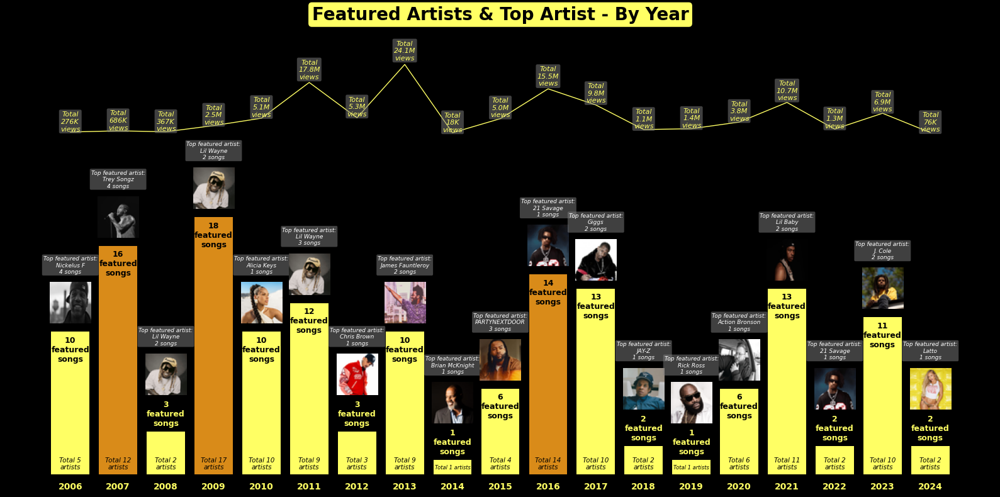

In [1066]:
featured_artist_year_agg = (
    all_song_with_thumbnail_df[(all_song_with_thumbnail_df["primary_artist.id"] == 130) & (all_song_with_thumbnail_df["featured_artists_id"] != 0)]
    .sort_values("release_date_for_display")
    .groupby("year")
    .agg(count_artist=("featured_artists_id", "nunique"), count_track=("release_date_for_display","count"), sum_pageviews=("stats.pageviews","sum"))
    .reset_index()
)
featured_artist_year_agg_artist = (
    all_song_with_thumbnail_df[(all_song_with_thumbnail_df["primary_artist.id"] == 130) & (all_song_with_thumbnail_df["featured_artists_id"] != 0)]
    .sort_values("release_date_for_display")
    .groupby(["year","featured_artists_name","feature_artist_thumbnail_local_path","featured_artists_id"])
    .agg(count_track=("release_date_for_display", "count"))
    .reset_index()
)
top_featured_artist_year = (
    featured_artist_year_agg_artist
    .sort_values(["year", "count_track"], ascending=[True, False])
    .drop_duplicates("year")
    .rename(columns={"featured_artists_name": "top_artist","count_track":"top_song_count"})
)
featured_artist_year_agg = featured_artist_year_agg.merge(top_featured_artist_year, on="year", how="left")
featured_artist_year_agg["top_artist"] = "Top featured artist:\n" + featured_artist_year_agg["top_artist"] + "\n" + featured_artist_year_agg["top_song_count"].astype(str) + " songs"
featured_artist_year_agg["year"] = featured_artist_year_agg["year"].astype(str)

top3_year = featured_artist_year_agg.nlargest(3,"count_artist")
colors = [
    "#d98b19" if year in top3_year["year"].values else "#ffff64"
    for year in featured_artist_year_agg["year"]
]


fig, ax = plt.subplots(figsize=(16,8), facecolor="black")
ax.set_facecolor("black")
bars = plt.bar(featured_artist_year_agg["year"], featured_artist_year_agg["count_track"], color=colors)

ax2 = ax.twinx()
ax2.plot(featured_artist_year_agg["year"], featured_artist_year_agg["sum_pageviews"], color="#ffff64", linewidth=1, label="Total pageviews")

for bar, top_song, feature_artist_thumbnail_local_path, count_artist in zip(bars, featured_artist_year_agg["top_artist"], featured_artist_year_agg["feature_artist_thumbnail_local_path"], featured_artist_year_agg["count_artist"]):
    if bar.get_height() > 5:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()-0.3, f"{bar.get_height():,.0f}" + "\nfeatured\nsongs", ha='center', va='top', fontsize=9, fontweight="bold", color="black")
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()+4, top_song, ha='center', va='bottom', fontsize=6.5, fontstyle="italic", rotation=0, color="white", bbox=dict(facecolor="gray", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
    else:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()+0.3, f"{bar.get_height():,.0f}" + "\nfeatured\nsongs", ha='center', va='bottom', fontsize=9, fontweight="bold", color="#ffff64")
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()+6, top_song, ha='center', va='bottom', fontsize=6.5, fontstyle="italic", rotation=0, color="white", bbox=dict(facecolor="gray", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))

    if bar.get_height() > 1:
        ax.text(bar.get_x() + bar.get_width()/2, 0.3, f"Total {count_artist:,.0f}\nartists", ha='center', va='bottom', fontsize=7.5, fontstyle="italic", rotation=0, color="black")
    else:
        ax.text(bar.get_x() + bar.get_width()/2, 0.3, f"Total {count_artist:,.0f} artists", ha='center', va='bottom', fontsize=6, fontstyle="italic", rotation=0, color="black")
        
    if feature_artist_thumbnail_local_path and os.path.exists(feature_artist_thumbnail_local_path):
        try:
            # img = mpimg.imread(feature_artist_thumbnail_local_path)
            img = Image.open(feature_artist_thumbnail_local_path).convert("RGBA")
            img = img.resize((47,47), Image.LANCZOS)
            imagebox = OffsetImage(img, zoom=1)
            if bar.get_height() > 5:
                ab = AnnotationBbox(imagebox, (bar.get_x() + bar.get_width()/2, bar.get_height()+2), frameon=False)
            else:
                ab = AnnotationBbox(imagebox, (bar.get_x() + bar.get_width()/2, bar.get_height()+4), frameon=False)
            ax.add_artist(ab)
        except Exception as e:
            print(f"Error loading image {feature_artist_thumbnail_local_path}: {e}")

for i, sum_pageviews in enumerate(featured_artist_year_agg["sum_pageviews"]):
    ax2.text(i, sum_pageviews*1.05, "Total\n" + format_kmb(sum_pageviews) + "\nviews", ha="center", va="bottom", fontsize=8, color="#ffff64", fontstyle="italic", bbox=dict(facecolor="gray", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))

ax.set_xticklabels(featured_artist_year_agg["year"], fontsize=10, fontweight="bold", color="#ffff64", y=-0.01)
ax.set_yticklabels([])
ax.tick_params(axis='both', length=0)
ax.set_ylim(0,featured_artist_year_agg["count_track"].head(20).max() * 1.7)

ax2.tick_params(axis='both', length=0)
ax2.set_yticklabels([])
ax2.set_ylim(featured_artist_year_agg["sum_pageviews"].head(20).max() * -5,featured_artist_year_agg["sum_pageviews"].head(20).max() * 1.4)

plt.title("Featured Artists & Top Artist - By Year", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="#ffff64", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout()
sns.despine(bottom = True, left = True)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/X.1. Featured artists BY YEAR.png", bbox_inches="tight")
plt.show()

## **X.2. Featured artists - BY MONTH**

### **X.2.1. Featured artists - BY MONTH**

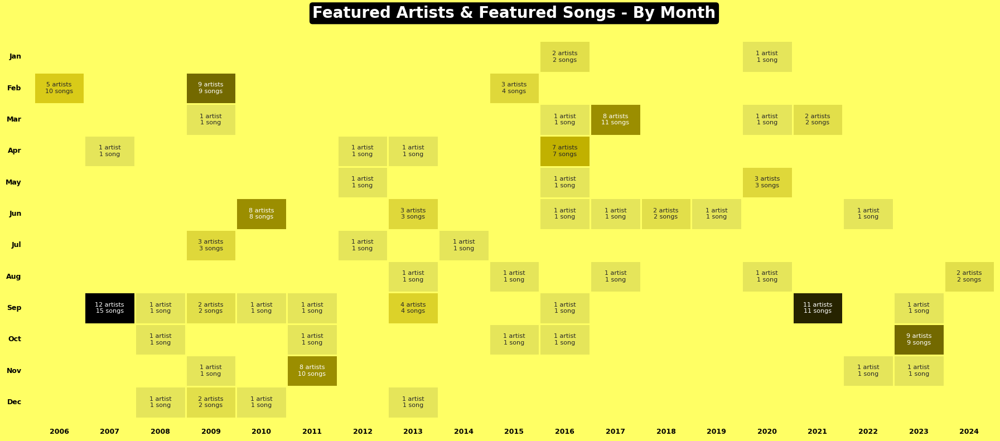

In [1067]:
featured_artist_pivot_artist = all_song_with_thumbnail_df[(all_song_with_thumbnail_df["primary_artist.id"] == 130) & (all_song_with_thumbnail_df["featured_artists_id"] != 0)] \
.pivot_table(
    index="month_number",
    columns="year",
    values="featured_artists_id",
    aggfunc="nunique",
    fill_value=0
)
featured_artist_pivot_track = all_song_with_thumbnail_df[(all_song_with_thumbnail_df["primary_artist.id"] == 130) & (all_song_with_thumbnail_df["featured_artists_id"] != 0)] \
.pivot_table(
    index="month_number",
    columns="year",
    values="release_date_for_display",
    aggfunc="count",
    fill_value=0
)

month_order = all_song_with_thumbnail_df[["month_number","month"]].drop_duplicates().dropna(subset=["month"]).sort_values("month_number")["month"].values
featured_artist_pivot_artist.index = month_order
featured_artist_pivot_track.index = month_order
mask = featured_artist_pivot_artist == 0

annot = featured_artist_pivot_artist.map(lambda x: f"{x:,.0f} artist" if x == 1 else (f"{x:,.0f} artists" if x > 1 else "")) + "\n" + featured_artist_pivot_track.map(lambda x: f"{x:,.0f} song" if x == 1 else (f"{x:,.0f} songs" if x > 1 else ""))


cmap = mcolors.LinearSegmentedColormap.from_list("custom", [(0, "#e5e55a"), (0.5, "#d4c200"), (1, "black")])

fig, ax = plt.subplots(figsize=(18,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
sns.heatmap(featured_artist_pivot_artist, annot=annot, fmt="", cmap=cmap, linewidths=1, linecolor="#ffff64", cbar=False, mask=mask, annot_kws={"fontsize":8})
plt.title("Featured Artists & Featured Songs - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="black", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.yticks(rotation=0, fontsize=9, fontweight="bold", color="black", x=-0.01)
plt.xticks(rotation=0, fontsize=9, fontweight="bold", color="black", y=-0.02)
plt.xlabel("")
plt.tick_params(axis='both', length=0)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/X.2.1. Featured artists BY MONTH.png", bbox_inches="tight")
plt.show()

### **X.2.2. Top featured artists by pageviews - BY MONTH**

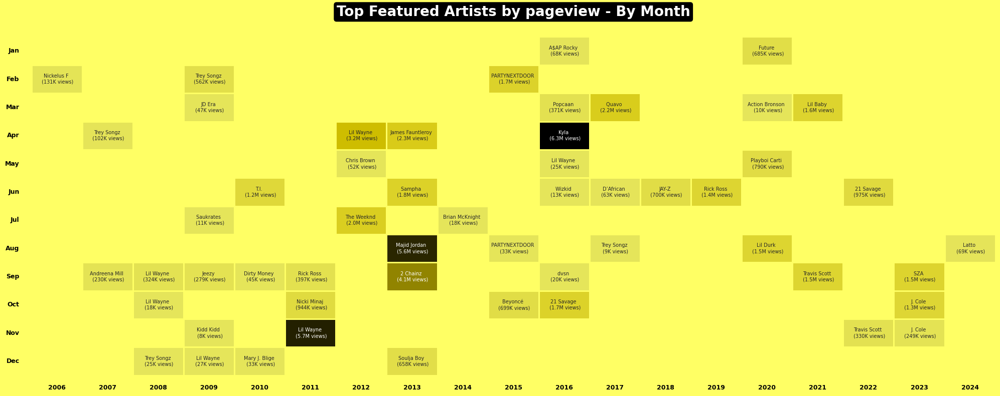

In [1068]:
featured_artist_month_agg = (
    all_song_with_thumbnail_df[(all_song_with_thumbnail_df["primary_artist.id"] == 130) & (all_song_with_thumbnail_df["featured_artists_id"] != 0)]
    .groupby(["year", "month_number", "featured_artists_name", "featured_artists_id"])
    .agg(sum_pageview=("stats.pageviews", "sum"))
    .reset_index()
)
featured_artist_month_agg_top = (
    featured_artist_month_agg
    .sort_values(["year", "month_number", "sum_pageview"], ascending=[True, True, False])
    .drop_duplicates(subset=["year", "month_number"])
)
featured_artist_month_agg_top_pivot = featured_artist_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="featured_artists_name"
)
featured_artist_month_agg_top_pivot_pageview = featured_artist_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="sum_pageview"
)

annot = (featured_artist_month_agg_top_pivot.stack()
    .astype(str)
    .to_frame("featured_artists_name")
    # .assign(featured_artists_name=lambda df: df["featured_artists_name"].apply(shorten_text))
    .join(featured_artist_month_agg_top_pivot_pageview.stack().to_frame("sum_pageview"))
    .apply(lambda row: f"{row['featured_artists_name']} \n ({format_kmb(row['sum_pageview'])} views)", axis=1)
    .unstack()
)

featured_artist_month_agg_top_pivot_pageview.index = month_order
annot.index = month_order
cmap = mcolors.LinearSegmentedColormap.from_list("custom", [(0, "#e5e55a"), (0.5, "#d4c200"), (1, "black")])

fig, ax = plt.subplots(figsize=(20,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
sns.heatmap(featured_artist_month_agg_top_pivot_pageview, annot=annot, fmt="", cmap=cmap, linewidths=1, linecolor="#ffff64", cbar=False, mask=featured_artist_month_agg_top_pivot_pageview.isna(), annot_kws={"fontsize":7})
plt.title("Top Featured Artists by pageview - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="black", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.yticks(rotation=0, fontsize=9, fontweight="bold", color="black", x=-0.01)
plt.xticks(rotation=0, fontsize=9, fontweight="bold", color="black", y=-0.02)
plt.xlabel("")
plt.tick_params(axis='both', length=0)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/X.2.2. Top featured artists by pageviews BY MONTH.png", bbox_inches="tight")
plt.show()

### **X.2.3. [THUMBNAIL] Featured artitst by pageviews - BY MONTH**

In [ ]:
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

featured_artist_to_img_path = dict(zip(all_song_with_thumbnail_df['featured_artists_id'], all_song_with_thumbnail_df['feature_artist_thumbnail_local_path']))

featured_artist_month_agg = (
    all_song_with_thumbnail_df[(all_song_with_thumbnail_df["primary_artist.id"] == 130) & (all_song_with_thumbnail_df["featured_artists_id"] != 0)]
    .groupby(["year", "month_number", "featured_artists_id"])
    .agg(sum_pageview=("stats.pageviews", "sum"))
    .reset_index()
)
featured_artist_month_agg_top = (
    featured_artist_month_agg
    .sort_values(["year", "month_number", "sum_pageview"], ascending=[True, True, False])
    .drop_duplicates(subset=["year", "month_number"])
)
featured_artist_month_agg_top_pivot = featured_artist_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="featured_artists_id"
).sort_index()

fig, ax = plt.subplots(figsize=(13.5,8.9), facecolor="black")
ax.axis('off')

# Calculate cell dimensions
n_rows = len(featured_artist_month_agg_top_pivot)
n_cols = len(featured_artist_month_agg_top_pivot.columns)
cell_width = 1.0 / n_cols
cell_height = 1.0 / n_rows

# Iterate through each cell in the pivot table
for i, (month_num, row) in enumerate(featured_artist_month_agg_top_pivot.iterrows()):
    for j, year in enumerate(featured_artist_month_agg_top_pivot.columns):
        featured_artists_id = row[year]
        img_path = featured_artist_to_img_path.get(featured_artists_id)
        if img_path and pd.notna(img_path):
            try:
                img = Image.open(img_path).convert("RGBA")
                img = img.resize((43,43), Image.LANCZOS)  
                img_array = np.array(img)

                x = j * cell_width + cell_width/2
                y = 1 - (i * cell_height + cell_height/2)

                imagebox = OffsetImage(img_array, zoom=1)
                ab = AnnotationBbox(imagebox, (x, y), frameon=False)
                ax.add_artist(ab)
            except Exception as e:
                print(f"Error loading image for {featured_artists_id} from {img_path}: {e}")

# Add column headers (years) at the bottom
for j, year in enumerate(featured_artist_month_agg_top_pivot.columns):
    x = j * cell_width + cell_width/2
    y = -0.02
    ax.text(x, y, str(year), ha='center', va='top', fontsize=10, weight='bold', color="#ffff64")

# Add row headers (month names) on the left
for i, month_num in enumerate(featured_artist_month_agg_top_pivot.index):
    x = -0.02
    y = 1 - (i * cell_height + cell_height/2)
    month_num = int(month_num) if pd.notna(month_num) else 0
    month_name = month_names[month_num-1] if 1 <= month_num <= 12 else f"Month {month_num}"
    ax.text(x, y, month_name, ha='right', va='center', fontsize=10, weight='bold', color="#ffff64")

plt.title("Top Featured Artists by pageview - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="#ffff64", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/X.2.3. THUMBNAIL Featured artitst by pageviews BY MONTH.png", bbox_inches="tight")
plt.show()

## **X.3. TOP FEATURED ARTISTs by Pageview - OVERTIME**

### **X.3.1. Top 20 Featured Artists by Songs**

/var/folders/7q/sfnchm8d521c9vslcz802kw80000gn/T/ipykernel_96145/1233884235.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=featured_artist_agg.head(20), y="featured_artists_name", x=(featured_artist_agg["count_track"]+1).head(20), dodge=False, palette=colors)


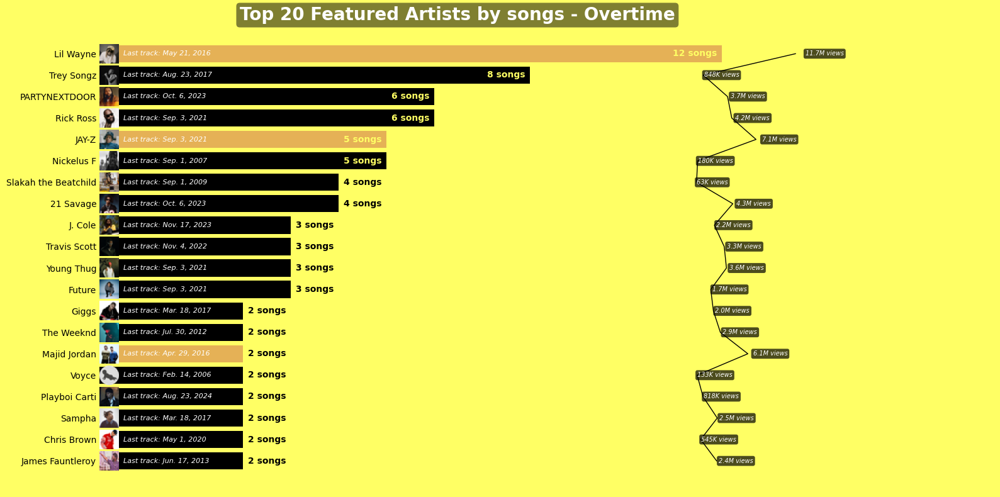

In [1070]:
featured_artist_agg = (
     all_song_with_thumbnail_df[(all_song_with_thumbnail_df["primary_artist.id"] == 130) & (all_song_with_thumbnail_df["featured_artists_id"] != 0)]
     .groupby(["featured_artists_id","featured_artists_name","feature_artist_thumbnail_local_path"])
     .agg(count_track=("release_date_for_display", "count"), sum_pageviews=("stats.pageviews","sum"),last_track_time=("release_date_with_abbreviated_month_for_display","first"))
     .sort_values(by="count_track",ascending=False)
     .reset_index()
)

top3 = featured_artist_agg.head(20).nlargest(3,"sum_pageviews")
colors = [
    "#fdb73e" if featured_artists_name in top3["featured_artists_name"].values else "black"
    for featured_artists_name in featured_artist_agg["featured_artists_name"].head(20)
]

fig, ax = plt.subplots(figsize=(16,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
ax = sns.barplot(data=featured_artist_agg.head(20), y="featured_artists_name", x=(featured_artist_agg["count_track"]+1).head(20), dodge=False, palette=colors)
ax2 = ax.twiny()
ax2.plot(featured_artist_agg["sum_pageviews"].head(20), range(len(featured_artist_agg.head(20))), color="black", linewidth=1)

for i, path in enumerate(featured_artist_agg["feature_artist_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((22,22), Image.LANCZOS)
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(0, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")

for i, (count_track, last_track_time, sum_pageviews) in enumerate(zip((featured_artist_agg["count_track"]+1).head(20), featured_artist_agg["last_track_time"].head(20),featured_artist_agg["sum_pageviews"].head(20))):
    if count_track > 4+1:
        ax.text(count_track-0.1, i, f"{count_track-1:,.0f}" + " songs", va="center", fontsize=10, ha="right", color="#ffff64", fontweight = "bold")
    else:
        ax.text(count_track+0.1, i, f"{count_track-1:,.0f}" + " songs", va="center", fontsize=10, ha="left", color="black", fontweight = "bold")
    ax.text(0.5, i, "Last track: " + last_track_time, va="center", ha="left", fontsize=8, color="white", fontstyle= 'italic')
    ax2.text(sum_pageviews*1.1, i, format_kmb(sum_pageviews) + " views", va="center", ha="left", fontsize=7, color="white", fontstyle= 'italic', bbox=dict(facecolor='black', alpha=0.7, boxstyle='round,pad=0.3', linewidth=0))

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', labelsize=10, length=0, colors="black")
ax.tick_params(axis='x', bottom=False, labelbottom=False)
ax.grid(False)
ax.set_xlim(0,(featured_artist_agg["count_track"]-1).head(20).max() * 1.7)

ax2.set_xlim(featured_artist_agg["sum_pageviews"].head(20).max() * -6, featured_artist_agg["sum_pageviews"].head(20).max() * 3)
ax2.set_xticks([])

plt.title("Top 20 Featured Artists by songs - Overtime", fontweight="bold", color="white", fontsize=20, pad=0, bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0), x=0.4)
sns.despine(bottom = True, left = True)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/X.3.1. Top 20 Featured Artists by Songs.png", bbox_inches="tight")
plt.show()

### **X.3.2. [WORDCLOUD] Top Featured Artists by Songs**

In [1071]:
featured_artists_freq = dict(sorted(zip(featured_artist_agg["featured_artists_name"].head(100), featured_artist_agg["count_track"].head(100)), key=lambda x: x[1], reverse=True))

wc = WordCloud(
    width=1200,
    height=800,
    background_color=None,
    mode="RGBA",
    prefer_horizontal=0.9,
    min_font_size=20,
    max_font_size=100,
    color_func=lambda *args, **kwargs: "white",
    font_path="/System/Library/Fonts/Supplemental/Arial Bold.ttf",
    relative_scaling=0,        
    # random_state=100
).generate_from_frequencies(featured_artists_freq)

fig, ax = plt.subplots(figsize=(8,6), facecolor="black")
ax.imshow([[(377/255,377/255,114/255,0.4)]], extent=[0,1200,0,8020])
ax.imshow(wc, interpolation="bilinear")
ax.axis("off")
plt.title("Top Featured Artitst by songs", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="#ffff64", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout(pad=0)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/X.3.2. WORDCLOUD Top Featured Artists by Songs.png", bbox_inches="tight")
plt.show()

### **X.3.3. [TREEMAP] Top Featured Artists by Songs**

In [ ]:
sizes = featured_artist_agg["count_track"].head(30).tolist()
labels = featured_artist_agg["featured_artists_name"] + "\n(" + featured_artist_agg["count_track"].astype(str) + " songs)"
paths = featured_artist_agg["feature_artist_thumbnail_local_path"].head(30).tolist()

# Normalize sizes to fit the 1200 x 800 frame.
# The treemap needs a total area equal to width*height.
# "normalize_sizes" function rescales sizes to this frame.
normed_sizes = squarify.normalize_sizes(sizes, 1200, 800)
rects = squarify.squarify(normed_sizes, 0, 0, 1200, 800)            # Create a list of coordinates of treemap rectangles

fig, ax = plt.subplots(figsize=(14,8), facecolor="black")
ax.axis("off")

for rect, label, path, size in zip(rects, labels, paths, sizes):
    x, y, w, h = rect["x"], rect["y"], rect["dx"], rect["dy"]           # Get x, y, w, h information: coordinates (x, y) lower left corner and dimensions w=dx, h=dy.
    try:
        img = mpimg.imread(path)
        ax.imshow(img, extent=[x, x+w, y, y+h], aspect="auto", zorder=0)

        ax.plot([x, x+w, x+w, x, x], [y, y, y+h, y+h, y], color="black", lw=6)

        ax.text(x + w/2, y + h/2, label, ha="center", va="center", color="#ffff64", fontsize=6, weight="bold", bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.2"))

    except Exception as e:
        print(f"Error loading {label}: {e}")

plt.title("Top Featured Artists by songs", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="#ffff64", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout(pad=0)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/X.3.3. TREEMAP Top Featured Artists by Songs.png", bbox_inches="tight")
plt.show()


## **X.4. TOP SONG of each TOP FEATURED ARTISTs by Pageview - OVERTIME**

In [ ]:
featured_artist_song_agg = (
     all_song_with_thumbnail_df[(all_song_with_thumbnail_df["primary_artist.id"] == 130) & (all_song_with_thumbnail_df["featured_artists_id"] != 0)]
     .groupby(["featured_artists_id","id","title_with_featured","release_date_with_abbreviated_month_for_display","song_thumbnail_local_path"])
     .agg(sum_pageviews=("stats.pageviews","sum"))
     .sort_values(["featured_artists_id", "sum_pageviews"], ascending=[True, False])
     .reset_index()
)
featured_artist_month_agg_top = (
     featured_artist_song_agg
     .drop_duplicates(subset=["featured_artists_id"])
     .rename(columns={"sum_pageviews":"top_song_pageview"})
     )

featured_artist_agg_2 = featured_artist_agg.merge(featured_artist_month_agg_top,on="featured_artists_id", how="left")


top3 = featured_artist_agg_2.head(20).nlargest(3,"sum_pageviews")
colors = [
    "#fdb73e" if title_with_featured in top3["title_with_featured"].values else "black"
    for title_with_featured in featured_artist_agg_2["title_with_featured"].head(20)
]

fig, ax = plt.subplots(figsize=(16,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
ax = sns.barplot(data=featured_artist_agg_2.head(20), y="title_with_featured", x=(featured_artist_agg_2["top_song_pageview"]).head(20), dodge=False, palette=colors)

for i, path in enumerate(featured_artist_agg_2["feature_artist_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((25,25), Image.LANCZOS)
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(2.15, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")

for i, path in enumerate(featured_artist_agg_2["song_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((25,25), Image.LANCZOS)
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(1.15, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")

for i, (top_song_pageview, release_date) in enumerate(zip((featured_artist_agg_2["top_song_pageview"]).head(20), featured_artist_agg_2["release_date_with_abbreviated_month_for_display"].head(20))):
     if top_song_pageview > 3_000_000:
          ax.text(top_song_pageview-50_000, i, format_kmb(top_song_pageview)+ " views", va="center", fontsize=10, ha="right", color="#ffff64", fontweight = "bold")
          ax.text(50_000, i, "(" + release_date + ")", va="center", ha="left", fontsize=8, color="white", fontstyle= 'italic')
     elif top_song_pageview > 100_000:
          ax.text(top_song_pageview+50_000, i, format_kmb(top_song_pageview)+ " views", va="center", fontsize=10, ha="left", color="black", fontweight = "bold")
          ax.text(50_000, i, "(" + release_date + ")", va="center", ha="left", fontsize=8, color="white", fontstyle= 'italic')
     else:
          ax.text(top_song_pageview+50_000, i, format_kmb(top_song_pageview)+ " views", va="center", fontsize=10, ha="left", color="black", fontweight = "bold")
          ax.text(top_song_pageview+500_000, i, "(" + release_date + ")", va="center", ha="left", fontsize=8, color="black", fontstyle= 'italic')

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', labelsize=10, length=0, colors="black", pad=60)
ax.tick_params(axis='x', bottom=False, labelbottom=False)
ax.grid(False)

plt.title("Top 20 Songs of Top 20 Featured Artists - Overtime", fontweight="bold", color="white", fontsize=20, pad=20, bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0), x=0.4)
sns.despine(bottom = True, left = True)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/X.4. TOP SONG of each TOP FEATURED ARTISTs by Pageview OVERTIME.png", bbox_inches="tight")
plt.show()

---
# **XI. ARTISTs FEATURING WITH**

## **XI.1. Artists featuring with - BY YEAR**

/var/folders/7q/sfnchm8d521c9vslcz802kw80000gn/T/ipykernel_96145/2656300976.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(artist_featuring_with_year_agg["year"], fontsize=10, fontweight="bold", y=-0.01)


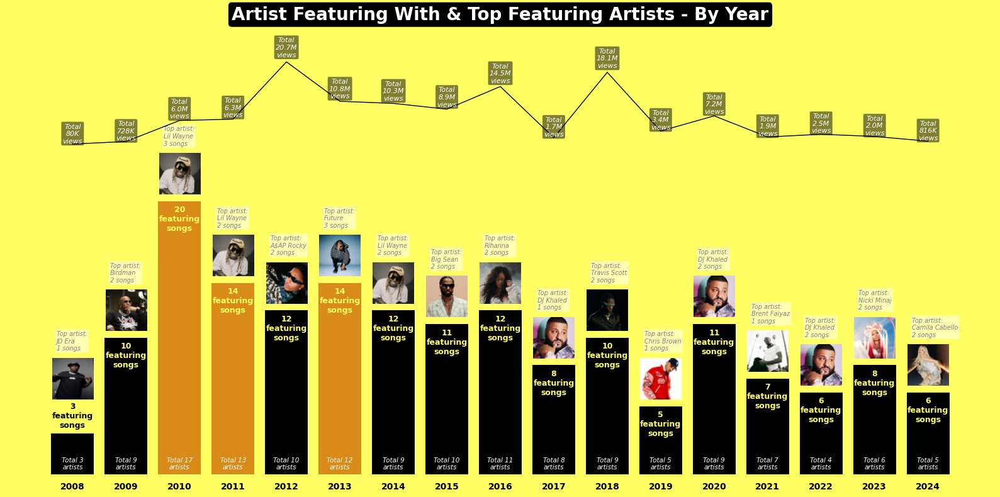

In [1074]:
artist_featuring_with_year_agg = (
    all_song_with_thumbnail_df[(all_song_with_thumbnail_df["featured_artists_id"] == 130) & (all_song_with_thumbnail_df["primary_artist.id"] != 130)]
    .sort_values("release_date_for_display")
    .groupby("year")
    .agg(count_artist=("primary_artist.id", "nunique"), count_track=("release_date_for_display","count"), sum_pageviews=("stats.pageviews","sum"))
    .reset_index()
)
artist_featuring_with_year_agg_artist = (
    all_song_with_thumbnail_df[(all_song_with_thumbnail_df["featured_artists_id"] == 130) & (all_song_with_thumbnail_df["primary_artist.id"] != 130)]
    .sort_values("release_date_for_display")
    .groupby(["year","primary_artist.name","primary_artist_thumbnail_local_path","primary_artist.id"])
    .agg(count_track=("release_date_for_display", "count"))
    .reset_index()
)
top_artist_featuring_with_year = (
    artist_featuring_with_year_agg_artist
    .sort_values(["year", "count_track"], ascending=[True, False])
    .drop_duplicates("year")
    .rename(columns={"primary_artist.name": "top_artist","count_track":"top_song_count"})
)

artist_featuring_with_year_agg = artist_featuring_with_year_agg.merge(top_artist_featuring_with_year, on="year", how="left")
artist_featuring_with_year_agg["top_artist"] = "Top artist:\n" + artist_featuring_with_year_agg["top_artist"] + "\n" + artist_featuring_with_year_agg["top_song_count"].astype(str) + " songs"
artist_featuring_with_year_agg["year"] = artist_featuring_with_year_agg["year"].astype(str)

top3_year = artist_featuring_with_year_agg.nlargest(3,"count_track")
colors = [
    "#d98b19" if year in top3_year["year"].values else "black"
    for year in artist_featuring_with_year_agg["year"]
]


fig, ax = plt.subplots(figsize=(16,8), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
bars = plt.bar(artist_featuring_with_year_agg["year"], artist_featuring_with_year_agg["count_track"], color=colors)

ax2 = ax.twinx()
ax2.plot(artist_featuring_with_year_agg["year"], artist_featuring_with_year_agg["sum_pageviews"], color="black", linewidth=1, label="Total pageviews")

for bar, top_artist, primary_artist_thumbnail_local_path, count_artist in zip(bars, artist_featuring_with_year_agg["top_artist"], artist_featuring_with_year_agg["primary_artist_thumbnail_local_path"], artist_featuring_with_year_agg["count_artist"]):
    ax.text(bar.get_x() + bar.get_width()/2, 0.3, f"Total {count_artist:,.0f}\nartists", ha='center', va='bottom', fontsize=7.5, fontstyle="italic", rotation=0, color="white")
    if bar.get_height() > 4:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()-0.3, f"{bar.get_height():,.0f}" + "\nfeaturing\nsongs", ha='center', va='top', fontsize=9, fontweight="bold", color="#ffff64")
        ax.text(bar.get_x() + bar.get_width()/2-0.3, bar.get_height()+4, top_artist, ha='left', va='bottom', fontsize=7, fontstyle="italic", rotation=0, color="gray", bbox=dict(facecolor="white", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
    else:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()+0.3, f"{bar.get_height():,.0f}" + "\nfeaturing\nsongs", ha='center', va='bottom', fontsize=9, fontweight="bold", color="black")
        ax.text(bar.get_x() + bar.get_width()/2-0.3, bar.get_height()+6, top_artist, ha='left', va='bottom', fontsize=7, fontstyle="italic", rotation=0, color="gray", bbox=dict(facecolor="white", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
        
    if primary_artist_thumbnail_local_path and os.path.exists(primary_artist_thumbnail_local_path):
        try:
            img = Image.open(primary_artist_thumbnail_local_path).convert("RGBA")
            img = img.resize((47,47), Image.LANCZOS)
            imagebox = OffsetImage(img, zoom=1)
            if bar.get_height() > 4:
                ab = AnnotationBbox(imagebox, (bar.get_x() + bar.get_width()/2, bar.get_height()+2), frameon=False)
            else:
                ab = AnnotationBbox(imagebox, (bar.get_x() + bar.get_width()/2, bar.get_height()+4), frameon=False)
            ax.add_artist(ab)
        except Exception as e:
            print(f"Error loading image {primary_artist_thumbnail_local_path}: {e}")

for i, sum_pageviews in enumerate(artist_featuring_with_year_agg["sum_pageviews"]):
    ax2.text(i, sum_pageviews*1.05, "Total\n" + format_kmb(sum_pageviews) + "\nviews", ha="center", va="bottom", fontsize=8, color="white", fontstyle="italic", bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))

ax.set_xticklabels(artist_featuring_with_year_agg["year"], fontsize=10, fontweight="bold", y=-0.01)
ax.set_yticklabels([])
ax.tick_params(axis='both', length=0)
ax.set_ylim(0,artist_featuring_with_year_agg["count_track"].max()*1.6)

ax2.tick_params(axis='both', length=0)
ax2.set_yticklabels([])
ax2.set_ylim(artist_featuring_with_year_agg["sum_pageviews"].max()*-4,artist_featuring_with_year_agg["sum_pageviews"].max()*1.3)

plt.title("Artist Featuring With & Top Featuring Artists - By Year", fontweight="bold", color="white", fontsize=20, pad=20, bbox=dict(facecolor="black", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout()
sns.despine(bottom = True, left = True)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/XI.1. Artists featuring with BY YEAR.png", bbox_inches="tight")
plt.show()

## **XI.2. Artists featuring with - BY MONTH**

### **XI.2.1. Artists featuring with - BY MONTH**

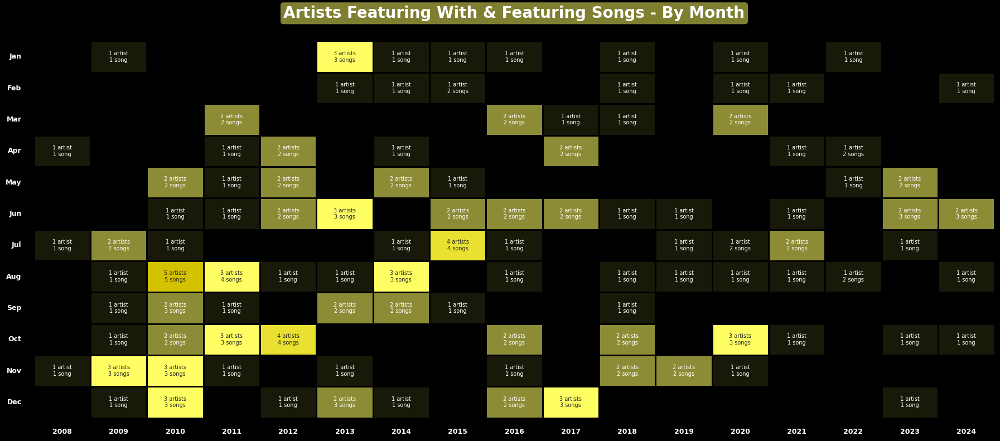

In [1075]:
artist_featuring_with_pivot_artist = all_song_with_thumbnail_df[(all_song_with_thumbnail_df["featured_artists_id"] == 130) & (all_song_with_thumbnail_df["primary_artist.id"] != 130)] \
.pivot_table(
    index="month_number",
    columns="year",
    values="primary_artist.id",
    aggfunc="nunique",
    fill_value=0
)
artist_featuring_with_pivot_track = all_song_with_thumbnail_df[(all_song_with_thumbnail_df["featured_artists_id"] == 130) & (all_song_with_thumbnail_df["primary_artist.id"] != 130)] \
.pivot_table(
    index="month_number",
    columns="year",
    values="release_date_for_display",
    aggfunc="count",
    fill_value=0
)

month_order = all_song_with_thumbnail_df[["month_number","month"]].drop_duplicates().dropna(subset=["month"]).sort_values("month_number")["month"].values
artist_featuring_with_pivot_artist.index = month_order
artist_featuring_with_pivot_track.index = month_order
mask = artist_featuring_with_pivot_artist == 0

annot = artist_featuring_with_pivot_artist.map(lambda x: f"{x:,.0f} artist" if x == 1 else (f"{x:,.0f} artists" if x > 1 else "")) + "\n" + artist_featuring_with_pivot_track.map(lambda x: f"{x:,.0f} song" if x == 1 else (f"{x:,.0f} songs" if x > 1 else ""))

cmap = mcolors.LinearSegmentedColormap.from_list("custom", [(0, "#19190a"), (0.5, "#ffff64"), (1, "#d4c200")])

fig, ax = plt.subplots(figsize=(18,8), facecolor="black")
ax.set_facecolor("black")
sns.heatmap(artist_featuring_with_pivot_artist, annot=annot, fmt="", cmap=cmap, linewidths=1, linecolor="black", cbar=False, mask=mask, annot_kws={"fontsize":7})
plt.title("Artists Featuring With & Featuring Songs - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="#ffff64", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.yticks(rotation=0, fontsize=9, fontweight="bold", color="white", x=-0.01)
plt.xticks(rotation=0, fontsize=9, fontweight="bold", color="white", y=-0.02)
plt.xlabel("")
plt.tick_params(axis='both', length=0)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/XI.2.1. Artists featuring with BY MONTH.png", bbox_inches="tight")
plt.show()

### **XI.2.2. Top artists featuring with by pageviews - BY MONTH**

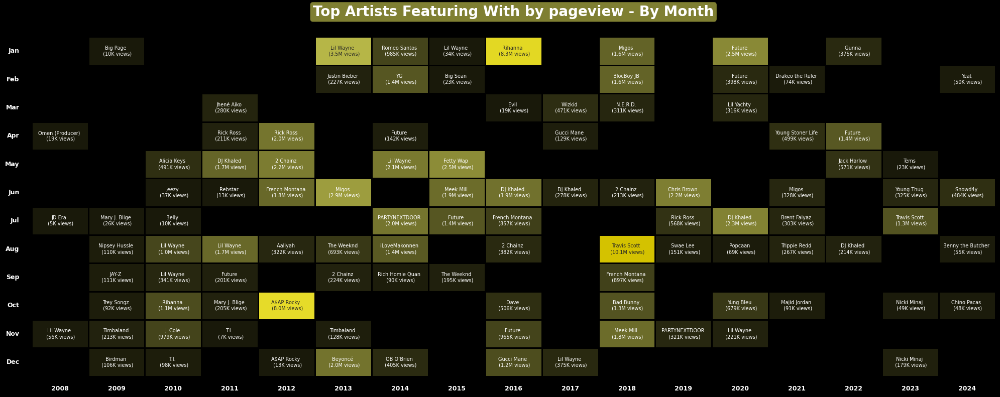

In [1076]:
artist_featuring_with_month_agg = (
    all_song_with_thumbnail_df[(all_song_with_thumbnail_df["featured_artists_id"] == 130) & (all_song_with_thumbnail_df["primary_artist.id"] != 130)]
    .groupby(["year", "month_number", "primary_artist.name", "primary_artist.id"])
    .agg(sum_pageview=("stats.pageviews", "sum"))
    .reset_index()
)
artist_featuring_with_month_agg_top = (
    artist_featuring_with_month_agg
    .sort_values(["year", "month_number", "sum_pageview"], ascending=[True, True, False])
    .drop_duplicates(subset=["year", "month_number"])
)
artist_featuring_with_month_agg_top_pivot = artist_featuring_with_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="primary_artist.name"
)
artist_featuring_with_month_agg_top_pivot_pageview = artist_featuring_with_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="sum_pageview"
)

annot = (artist_featuring_with_month_agg_top_pivot.stack()
    .astype(str)
    .to_frame("primary_artist.name")
    # .assign(featured_artists_name=lambda df: df["featured_artists_name"].apply(shorten_text))
    .join(artist_featuring_with_month_agg_top_pivot_pageview.stack().to_frame("sum_pageview"))
    .apply(lambda row: f"{row['primary_artist.name']} \n ({format_kmb(row['sum_pageview'])} views)", axis=1)
    .unstack()
)

artist_featuring_with_month_agg_top_pivot_pageview.index = month_order
annot.index = month_order
cmap = mcolors.LinearSegmentedColormap.from_list("custom", [(0, "#19190a"), (0.5, "#ffff64"), (1, "#d4c200")])

fig, ax = plt.subplots(figsize=(20,8), facecolor="black")
ax.set_facecolor("black")
sns.heatmap(artist_featuring_with_month_agg_top_pivot_pageview, annot=annot, fmt="", cmap=cmap, linewidths=1, linecolor="black", cbar=False, mask=artist_featuring_with_month_agg_top_pivot_pageview.isna(), annot_kws={"fontsize":7})
plt.title("Top Artists Featuring With by pageview - By Month", fontweight="bold", color="white", fontsize=20, pad=30, bbox=dict(facecolor="#ffff64", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.yticks(rotation=0, fontsize=9, fontweight="bold", color="white", x=-0.01)
plt.xticks(rotation=0, fontsize=9, fontweight="bold", color="white", y=-0.02)
plt.xlabel("")
plt.tick_params(axis='both', length=0)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/XI.2.2. Top artists featuring with by pageviews BY MONTH.png", bbox_inches="tight")
plt.show()

### **XI.2.3. [THUMBNAIL] Top artists featuring with by pageviews - BY MONTH**

In [ ]:
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

artist_featuring_with_to_img_path = dict(zip(all_song_with_thumbnail_df['primary_artist.id'], all_song_with_thumbnail_df['primary_artist_thumbnail_local_path']))

artist_featuring_month_agg = (
    all_song_with_thumbnail_df[(all_song_with_thumbnail_df["featured_artists_id"] == 130) & (all_song_with_thumbnail_df["primary_artist.id"] != 130)]
    .groupby(["year", "month_number", "primary_artist.id"])
    .agg(sum_pageview=("stats.pageviews", "sum"))
    .reset_index()
)
artist_featuring_month_agg_top = (
    artist_featuring_month_agg
    .sort_values(["year", "month_number", "sum_pageview"], ascending=[True, True, False])
    .drop_duplicates(subset=["year", "month_number"])
)
artist_featuring_month_agg_top_pivot = artist_featuring_month_agg_top.pivot(
    index="month_number",
    columns="year",
    values="primary_artist.id"
).sort_index()

fig, ax = plt.subplots(figsize=(12.2,9.1), facecolor="#ffff64")
ax.axis('off')

# Calculate cell dimensions
n_rows = len(artist_featuring_month_agg_top_pivot)
n_cols = len(artist_featuring_month_agg_top_pivot.columns)
cell_width = 1.0 / n_cols
cell_height = 1.0 / n_rows

# Iterate through each cell in the pivot table
for i, (month_num, row) in enumerate(artist_featuring_month_agg_top_pivot.iterrows()):
    for j, year in enumerate(artist_featuring_month_agg_top_pivot.columns):
        artist_id = row[year]
        img_path = artist_featuring_with_to_img_path.get(artist_id)
        if img_path and pd.notna(img_path):
            try:
                img = Image.open(img_path).convert("RGBA")
                img = img.resize((45,45), Image.LANCZOS)  
                img_array = np.array(img)

                x = j * cell_width + cell_width/2
                y = 1 - (i * cell_height + cell_height/2)

                imagebox = OffsetImage(img_array, zoom=1)
                ab = AnnotationBbox(imagebox, (x, y), frameon=False)
                ax.add_artist(ab)
            except Exception as e:
                print(f"Error loading image for {artist_id} from {img_path}: {e}")

# Add column headers (years) at the bottom
for j, year in enumerate(artist_featuring_month_agg_top_pivot.columns):
    x = j * cell_width + cell_width/2
    y = -0.02
    ax.text(x, y, str(year), ha='center', va='top', fontsize=10, weight='bold', color="black")

# Add row headers (month names) on the left
for i, month_num in enumerate(artist_featuring_month_agg_top_pivot.index):
    x = -0.02
    y = 1 - (i * cell_height + cell_height/2)
    month_num = int(month_num) if pd.notna(month_num) else 0
    month_name = month_names[month_num-1] if 1 <= month_num <= 12 else f"Month {month_num}"
    ax.text(x, y, month_name, ha='right', va='center', fontsize=10, weight='bold', color="black")

plt.title("Top Artists Featuring With by pageview - By Month", fontweight="bold", color="white", fontsize=20, pad=20, bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/XI.2.3. THUMBNAIL Top artists featuring with by pageviews BY MONTH.png", bbox_inches="tight")
plt.show()

## **XI.3. TOP ARTISTs FEATURING WITH by Pageview - OVERTIME**

### **XI.3.1. Top 20 Artists Featuring With by Songs**

In [ ]:
artist_featuring_with_agg = (
     all_song_with_thumbnail_df[(all_song_with_thumbnail_df["featured_artists_id"] == 130) & (all_song_with_thumbnail_df["primary_artist.id"] != 130)]
     .groupby(["primary_artist.id","primary_artist.name","primary_artist_thumbnail_local_path"])
     .agg(count_track=("release_date_for_display", "count"), sum_pageviews=("stats.pageviews","sum"),last_track_time=("release_date_with_abbreviated_month_for_display","first"))
     .sort_values(by="count_track",ascending=False)
     .reset_index()
)

top3 = artist_featuring_with_agg.head(20).nlargest(3,"sum_pageviews")
colors = [
    "#fdb73e" if primary_artist_id in top3["primary_artist.id"].values else "#ffff64"
    for primary_artist_id in artist_featuring_with_agg["primary_artist.id"].head(20)
]

fig, ax = plt.subplots(figsize=(16,8), facecolor="black")
ax.set_facecolor("black")
ax = sns.barplot(data=artist_featuring_with_agg.head(20), y="primary_artist.name", x=(artist_featuring_with_agg["count_track"]+1).head(20), dodge=False, palette=colors)
ax2 = ax.twiny()
ax2.plot(artist_featuring_with_agg["sum_pageviews"].head(20), range(len(artist_featuring_with_agg.head(20))), color="#ffff64", linewidth=1)

for i, path in enumerate(artist_featuring_with_agg["primary_artist_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((22,22), Image.LANCZOS)
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(0, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")

for i, (count_track, last_track_time, sum_pageviews) in enumerate(zip((artist_featuring_with_agg["count_track"]+1).head(20), artist_featuring_with_agg["last_track_time"].head(20),artist_featuring_with_agg["sum_pageviews"].head(20))):
    if count_track > 4+1:
        ax.text(count_track-0.1, i, f"{count_track-1:,.0f}" + " songs", va="center", fontsize=10, ha="right", color="black", fontweight = "bold")
    else:
        ax.text(count_track+0.1, i, f"{count_track-1:,.0f}" + " songs", va="center", fontsize=10, ha="left", color="#ffff64", fontweight = "bold")
    ax.text(0.5, i, "Last track: " + last_track_time, va="center", ha="left", fontsize=8, color="black", fontstyle= 'italic')
    ax2.text(sum_pageviews*1.1, i, format_kmb(sum_pageviews) + " views", va="center", ha="left", fontsize=7, color="black", fontstyle= 'italic', bbox=dict(facecolor='#ffff64', alpha=0.7, boxstyle='round,pad=0.3', linewidth=0))

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', labelsize=10, length=0, colors="#ffff64")
ax.tick_params(axis='x', bottom=False, labelbottom=False)
ax.grid(False)
ax.set_xlim(0,(artist_featuring_with_agg["count_track"]-1).head(20).max() * 1.7)

ax2.set_xlim(artist_featuring_with_agg["sum_pageviews"].head(20).max() * -5, artist_featuring_with_agg["sum_pageviews"].head(20).max() * 3)
ax2.set_xticks([])

plt.title("Top 20 Artists Featuring With by songs - Overtime", fontweight="bold", color="black", fontsize=20, pad=0, bbox=dict(facecolor="#ffff64", alpha=1, boxstyle="round,pad=0.2", linewidth=0), x=0.4)
sns.despine(bottom = True, left = True)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/XI.3.1. Top 20 Artists Featuring With by Songs.png", bbox_inches="tight")
plt.show()

### **XI.3.2. [WORDCLOUD] Top 20 Artists Featuring With by Songs**

In [ ]:
artist_featuring_with_freq = dict(sorted(zip(artist_featuring_with_agg["primary_artist.name"].head(100), artist_featuring_with_agg["count_track"].head(100)), key=lambda x: x[1], reverse=True))

wc = WordCloud(
    width=1200,
    height=800,
    background_color=None,
    mode="RGBA",
    prefer_horizontal=0.9,
    min_font_size=20,
    max_font_size=100,
    color_func=lambda *args, **kwargs: "white",
    font_path="/System/Library/Fonts/Supplemental/Arial Bold.ttf",
    relative_scaling=0,        
    random_state=100
).generate_from_frequencies(artist_featuring_with_freq)

fig, ax = plt.subplots(figsize=(8,6), facecolor="#ffff64")
ax.imshow([[(0/255,0/255,0/255,0.6)]], extent=[0,1200,0,8020])
ax.imshow(wc, interpolation="bilinear")
ax.axis("off")
plt.title("Top Artists Featuring With by pageviews", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="white", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout(pad=0)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/XI.3.2. WORDCLOUD Top 20 Artists Featuring With by Songs.png", bbox_inches="tight")
plt.show()

### **XI.3.3. [TREEMAP] Top 20 Artists Featuring With by Songs**

In [ ]:
sizes = artist_featuring_with_agg["count_track"].head(30).tolist()
labels = artist_featuring_with_agg["primary_artist.name"] + "\n(" + artist_featuring_with_agg["count_track"].astype(str) + " songs)"
paths = artist_featuring_with_agg["primary_artist_thumbnail_local_path"].head(30).tolist()

# Normalize sizes to fit the 1200 x 800 frame.
# The treemap needs a total area equal to width*height.
# "normalize_sizes" function rescales sizes to this frame.
normed_sizes = squarify.normalize_sizes(sizes, 1200, 800)
rects = squarify.squarify(normed_sizes, 0, 0, 1200, 800)            # Create a list of coordinates of treemap rectangles


fig, ax = plt.subplots(figsize=(14,8), facecolor="#ffff64")
ax.axis("off")

for rect, label, path, size in zip(rects, labels, paths, sizes):
    x, y, w, h = rect["x"], rect["y"], rect["dx"], rect["dy"]           # Get x, y, w, h information: coordinates (x, y) lower left corner and dimensions w=dx, h=dy.
    try:
        img = mpimg.imread(path)
        ax.imshow(img, extent=[x, x+w, y, y+h], aspect="auto", zorder=0)

        ax.plot([x, x+w, x+w, x, x], [y, y, y+h, y+h, y], color="#ffff64", lw=6)

        ax.text(x + w/2, y + h/2, label, ha="center", va="center", color="#ffff64", fontsize=7, weight="bold", bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.2"))

    except Exception as e:
        print(f"Error loading {label}: {e}")

plt.title("Top Artists Featuring With by songs", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="white", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout(pad=0)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/XI.3.3. TREEMAP Top 20 Artists Featuring With by Songs.png", bbox_inches="tight")
plt.show()


## **XI.4. TOP SONG of each TOP ARTISTs FEATURING WITH by Pageview - OVERTIME**

In [ ]:
artist_featuring_with_song_agg = (
     all_song_with_thumbnail_df[(all_song_with_thumbnail_df["featured_artists_id"] == 130) & (all_song_with_thumbnail_df["primary_artist.id"] != 130)]
     .groupby(["primary_artist.id","id","full_title","release_date_with_abbreviated_month_for_display","song_thumbnail_local_path"])
     .agg(sum_pageviews=("stats.pageviews","sum"))
     .sort_values(["primary_artist.id", "sum_pageviews"], ascending=[True, False])
     .reset_index()
)
artist_featuring_with_song_agg_top = (
     artist_featuring_with_song_agg
     .drop_duplicates(subset=["primary_artist.id"])
     .rename(columns={"sum_pageviews":"top_song_pageview"})
     )

artist_featuring_with_agg_2 = artist_featuring_with_agg.merge(artist_featuring_with_song_agg_top,on="primary_artist.id", how="left")


top3 = artist_featuring_with_agg_2.head(20).nlargest(3,"sum_pageviews")
colors = [
    "#fdb73e" if full_title in top3["full_title"].values else "#ffff64"
    for full_title in artist_featuring_with_agg_2["full_title"].head(20)
]

fig, ax = plt.subplots(figsize=(16,8), facecolor="black")
ax.set_facecolor("black")
ax = sns.barplot(data=artist_featuring_with_agg_2.head(20), y="full_title", x=(artist_featuring_with_agg_2["top_song_pageview"]).head(20), dodge=False, palette=colors)

for i, path in enumerate(artist_featuring_with_agg_2["primary_artist_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((25,25), Image.LANCZOS)
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(2.15, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")

for i, path in enumerate(artist_featuring_with_agg_2["song_thumbnail_local_path"].head(20)):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((25,25), Image.LANCZOS)
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(1.15, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")

for i, (top_song_pageview, release_date) in enumerate(zip((artist_featuring_with_agg_2["top_song_pageview"]).head(20), artist_featuring_with_agg_2["release_date_with_abbreviated_month_for_display"].head(20))):
     if top_song_pageview > 4_000_000:
          ax.text(top_song_pageview-70_000, i, format_kmb(top_song_pageview)+ " views", va="center", fontsize=10, ha="right", color="black", fontweight = "bold")
          ax.text(50_000, i, "(" + release_date + ")", va="center", ha="left", fontsize=8, color="black", fontstyle= 'italic')
     elif top_song_pageview > 1_000_000:
          ax.text(top_song_pageview+70_000, i, format_kmb(top_song_pageview)+ " views", va="center", fontsize=10, ha="left", color="#ffff64", fontweight = "bold")
          ax.text(50_000, i, "(" + release_date + ")", va="center", ha="left", fontsize=8, color="black", fontstyle= 'italic')
     else:
          ax.text(top_song_pageview+70_000, i, format_kmb(top_song_pageview)+ " views", va="center", fontsize=10, ha="left", color="#ffff64", fontweight = "bold")
          ax.text(top_song_pageview+1_120_000, i, "(" + release_date + ")", va="center", ha="left", fontsize=8, color="white", fontstyle= 'italic')

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', labelsize=10, length=0, colors="#ffff64", pad=60)
ax.tick_params(axis='x', bottom=False, labelbottom=False)
ax.grid(False)

plt.title("Top 20 Songs of Top 20 Artists Featuring With - Overtime", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="#ffff64", alpha=0.7, boxstyle="round,pad=0.2", linewidth=0), x=0.4)
sns.despine(bottom = True, left = True)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/XI.4. TOP SONG of each TOP ARTISTs FEATURING WITH by Pageview OVERTIME.png", bbox_inches="tight")
plt.show()

---
# **XII. SONGs as CO-PRIMARY ARTIST**

## **XII.1. Songs as co-primary artist - BY YEAR**

/var/folders/7q/sfnchm8d521c9vslcz802kw80000gn/T/ipykernel_96145/4179994766.py:55: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(co_primary_song_year_agg["year"], fontsize=10, fontweight="bold", color="#ffff64", y=-0.01)


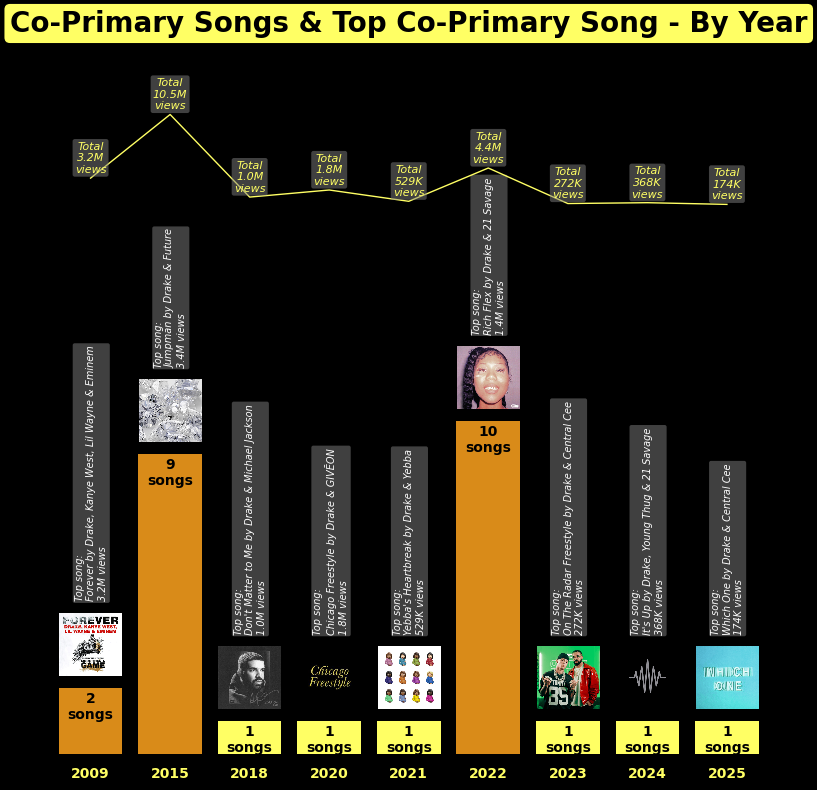

In [1082]:
co_primary_song_year_agg = (
    all_song_with_thumbnail_df[(all_song_with_thumbnail_df["primary_artist.id"] == 130) & (all_song_with_thumbnail_df["featured_artists_id"] == 0) & (all_song_with_thumbnail_df["artist_names"].str.contains("&", na=False))]
    .sort_values("release_date_for_display")
    .groupby("year")
    .agg(count_track=("release_date_for_display", "count"), sum_pageviews=("stats.pageviews","sum"))
    .reset_index()
)
co_primary_song_year_agg_song = (
    all_song_with_thumbnail_df[(all_song_with_thumbnail_df["primary_artist.id"] == 130) & (all_song_with_thumbnail_df["featured_artists_id"] == 0) & (all_song_with_thumbnail_df["artist_names"].str.contains("&", na=False))]
    .sort_values("release_date_for_display")
    .groupby(["year","full_title","song_thumbnail_local_path"])
    .agg(sum_pageviews=("stats.pageviews", "sum"))
    .reset_index()
)
top_co_primary_song_year_agg_song = (
    co_primary_song_year_agg_song
    .sort_values(["year", "sum_pageviews"], ascending=[True, False])
    .drop_duplicates("year")
    .rename(columns={"full_title": "top_song","sum_pageviews":"top_song_pageview"})
)
co_primary_song_year_agg = co_primary_song_year_agg.merge(top_co_primary_song_year_agg_song, on="year", how="left")
co_primary_song_year_agg["top_song"] = "Top song:\n" + co_primary_song_year_agg["top_song"] + "\n" + co_primary_song_year_agg["top_song_pageview"].apply(format_kmb) + " views"
co_primary_song_year_agg["year"] = co_primary_song_year_agg["year"].astype(str)

top3_year = co_primary_song_year_agg.nlargest(3,"count_track")
colors = [
    "#d98b19" if year in top3_year["year"].values else "#ffff64"
    for year in co_primary_song_year_agg["year"]
]


fig, ax = plt.subplots(figsize=(8,8), facecolor="black")
ax.set_facecolor("black")
bars = plt.bar(co_primary_song_year_agg["year"], co_primary_song_year_agg["count_track"], color=colors)

ax2 = ax.twinx()
ax2.plot(co_primary_song_year_agg["year"], co_primary_song_year_agg["sum_pageviews"], color="#ffff64", linewidth=1, label="Total pageviews")

for bar, top_song, song_thumbnail_local_path in zip(bars, co_primary_song_year_agg["top_song"], co_primary_song_year_agg["song_thumbnail_local_path"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()-0.1, f"{bar.get_height():,.0f}" + "\nsongs", ha='center', va='top', fontsize=10, fontweight="bold", color="black")
    ax.text(bar.get_x() + bar.get_width()/2-0.2, bar.get_height()+2.6, top_song, ha='left', va='bottom', fontsize=7, fontstyle="italic", rotation=90, color="white", bbox=dict(facecolor="gray", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))
        
    if song_thumbnail_local_path and os.path.exists(song_thumbnail_local_path):
        try:
            img = mpimg.imread(song_thumbnail_local_path)
            imagebox = OffsetImage(img, zoom=0.15)
            ab = AnnotationBbox(imagebox, (bar.get_x() + bar.get_width()/2, bar.get_height()+1.3), frameon=False)
            ax.add_artist(ab)
        except Exception as e:
            print(f"Error loading image {song_thumbnail_local_path}: {e}")

for i, sum_pageviews in enumerate(co_primary_song_year_agg["sum_pageviews"]):
    ax2.text(i, sum_pageviews+max(co_primary_song_year_agg["sum_pageviews"])*0.04, "Total\n" + format_kmb(sum_pageviews) + "\nviews", ha="center", va="bottom", fontsize=8, color="#ffff64", fontstyle="italic", bbox=dict(facecolor="gray", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0))

ax.set_xticklabels(co_primary_song_year_agg["year"], fontsize=10, fontweight="bold", color="#ffff64", y=-0.01)
ax.set_yticklabels([])
ax.tick_params(axis='both', length=0)
ax.set_ylim(0,co_primary_song_year_agg["count_track"].max()*2)

ax2.tick_params(axis='both', length=0)
ax2.set_yticklabels([])
ax2.set_ylim(co_primary_song_year_agg["sum_pageviews"].max()*-6,co_primary_song_year_agg["sum_pageviews"].max()*1.3)

plt.title("Co-Primary Songs & Top Co-Primary Song - By Year", fontweight="bold", color="black", fontsize=20, pad=40, bbox=dict(facecolor="#ffff64", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout()
sns.despine(bottom = True, left = True)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/XII.1. Songs as co-primary artist BY YEAR.png", bbox_inches="tight")
plt.show()

## **XII.2. Songs as co-primary artist by Pageview - OVERTIME**

### **XII.2.1. All Songs as co-primary artist by Pageview**

In [ ]:
co_primary_song_agg = all_song_with_thumbnail_df[(all_song_with_thumbnail_df["primary_artist.id"] == 130) & (all_song_with_thumbnail_df["featured_artists_id"] == 0) & (all_song_with_thumbnail_df["artist_names"].str.contains("&", na=False))] \
    [["full_title","stats.pageviews","release_date_with_abbreviated_month_for_display","song_thumbnail_local_path","annotation_count","pyongs_count","year"]] \
    .sort_values(by="stats.pageviews",ascending=False)

top3 = co_primary_song_agg.nlargest(3,"annotation_count")
colors = [
    "#fdb73e" if full_title in top3["full_title"].values else "black"
    for full_title in co_primary_song_agg["full_title"]
]

fig, ax = plt.subplots(figsize=(16,11), facecolor="#ffff64")
ax.set_facecolor("#ffff64")
ax = sns.barplot(data=co_primary_song_agg, y="full_title", x=(co_primary_song_agg["stats.pageviews"]), dodge=False, palette=colors)
ax2 = ax.twiny()
ax2.plot(co_primary_song_agg["pyongs_count"], range(len(co_primary_song_agg)), color="black", linewidth=1)

for i, path in enumerate(co_primary_song_agg["song_thumbnail_local_path"]):
    try:
        if os.path.exists(path):
            img = Image.open(path).convert("RGBA")
            img = img.resize((22,22), Image.LANCZOS)
            imagebox = OffsetImage(img, zoom=1)
            ab = AnnotationBbox(imagebox, (0, i), frameon=False, xycoords="data", box_alignment=(1.15, 0.5))
            ax.add_artist(ab)
        else:
            print(f"File not exist: {path}")
    except Exception as e:
        print(f"Error loading {path}: {e}")

for i, (pageviews, release_date, annotation_count) in enumerate(zip(co_primary_song_agg["stats.pageviews"], co_primary_song_agg["release_date_with_abbreviated_month_for_display"], co_primary_song_agg["annotation_count"])):
    if pageviews > 1_000_000:
        ax.text(pageviews-50_000, i, format_kmb(pageviews) + " views", va="center", fontsize=10, ha="right", color="#ffff64", fontweight = "bold")
        ax.text(pageviews+50_000, i, "(" + f"{annotation_count:,.0f}" + " annots)", va="center", ha="left", fontsize=8, color="gray", fontstyle= 'italic')
        ax.text(50_000, i, release_date, va="center", ha="left", fontsize=8, color="white", fontstyle= 'italic')
    elif pageviews > 400_000:
        ax.text(pageviews+50_000, i, format_kmb(pageviews) + " views", va="center", fontsize=10, ha="left", color="black", fontweight = "bold")
        ax.text(pageviews+500_000, i, "(" + f"{annotation_count:,.0f}" + " annots)", va="center", ha="left", fontsize=8, color="gray", fontstyle= 'italic')
        ax.text(50_000, i, release_date, va="center", ha="left", fontsize=8, color="white", fontstyle= 'italic')
    else:
        ax.text(pageviews+50_000, i, format_kmb(pageviews) + " views", va="center", fontsize=10, ha="left", color="black", fontweight = "bold")
        ax.text(pageviews+850_000, i, "(" + f"{annotation_count:,.0f}" + " annots)", va="center", ha="left", fontsize=8, color="gray", fontstyle= 'italic')
        ax.text(pageviews+500_000, i, release_date, va="center", ha="left", fontsize=8, color="black", fontstyle= 'italic')

for i, pyongs_count in enumerate(co_primary_song_agg["pyongs_count"]):
    ax2.text(pyongs_count*1.05, i, f"{pyongs_count:,.0f} pyongs", va="center", ha="left", fontsize=7, color="black", fontstyle= 'italic', bbox=dict(facecolor='white', alpha=0.7, boxstyle='round,pad=0.3', linewidth=0))

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='y', labelsize=10, length=0, colors="black", pad=30)
ax.tick_params(axis='x', bottom=False, labelbottom=False)
ax.grid(False)
ax.set_xlim(0,co_primary_song_agg["stats.pageviews"].max() * 1.5)

ax2.set_xlim(co_primary_song_agg["pyongs_count"].max() * -3, co_primary_song_agg["pyongs_count"].max() * 1.5)
ax2.set_xticks([])

plt.title("All Co-Primary Songs by pageview - Overtime", fontweight="bold", color="white", fontsize=20, pad=0, bbox=dict(facecolor="black", alpha=0.5, boxstyle="round,pad=0.2", linewidth=0), x=0.4)
sns.despine(bottom = True, left = True)
plt.tight_layout()
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/XII.2.1. All Songs as co-primary artist by Pageview.png", bbox_inches="tight")
plt.show()

### **XII.2.2. [TREEMAP] All Songs as co-primary artist by Pageview**

In [ ]:
def format_text(text: str) -> str:
    words = text.split()
    if len(words) < 3:
        return text
    return "\n".join([" ".join(words[i:i+2]) for i in range(0, len(words), 2)])

sizes = co_primary_song_agg["stats.pageviews"].tolist()
labels = (co_primary_song_agg["full_title"].apply(format_text) + "\n(" + co_primary_song_agg["stats.pageviews"].apply(format_kmb) + " views)\n- " + co_primary_song_agg["year"].astype(str)).tolist()
paths = co_primary_song_agg["song_thumbnail_local_path"].tolist()

# Normalize sizes to fit the 1200 x 800 frame.
# The treemap needs a total area equal to width*height.
# "normalize_sizes" function rescales sizes to this frame.
normed_sizes = squarify.normalize_sizes(sizes, 1200, 800)
rects = squarify.squarify(normed_sizes, 0, 0, 1200, 800)            # Create a list of coordinates of treemap rectangles

fig, ax = plt.subplots(figsize=(14,8), facecolor="black")
ax.axis("off")

for rect, label, path, size in zip(rects, labels, paths, sizes):
    x, y, w, h = rect["x"], rect["y"], rect["dx"], rect["dy"]           # Get x, y, w, h information: coordinates (x, y) lower left corner and dimensions w=dx, h=dy.
    try:
        img = mpimg.imread(path)
        ax.imshow(img, extent=[x, x+w, y, y+h], aspect="auto", zorder=0)

        ax.plot([x, x+w, x+w, x, x], [y, y, y+h, y+h, y], color="black", lw=6)

        ax.text(x + w/2, y + h/2, label, ha="center", va="center", color="#ffff64", fontsize=6, weight="bold", bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.2"))

    except Exception as e:
        print(f"Error loading {label}: {e}")

plt.title("Top Co-Primary Songs by pageviews", fontweight="bold", color="black", fontsize=20, pad=20, bbox=dict(facecolor="#ffff64", alpha=1, boxstyle="round,pad=0.2", linewidth=0))
plt.tight_layout(pad=0)
plt.savefig("/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/XII.2.2. TREEMAP All Songs as co-primary artist by Pageview.png", bbox_inches="tight")
plt.show()


---
# **THE END**

In [1085]:
folder_path = "/Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/"
markdown_lines = []

for filename in sorted(os.listdir(folder_path)):
    if filename.endswith(".png"):
        old_path = os.path.join(folder_path, filename)
        # Thay khoảng trắng bằng dấu gạch ngang
        new_filename = filename.replace(" ", "-")
        new_path = os.path.join(folder_path, new_filename)

        # Rename file
        os.rename(old_path, new_path)

        # Tạo dòng markdown
        markdown_lines.append(f"![](images/{new_filename})")

# Ghi ra file markdown
output_md = os.path.join(folder_path, "images.md")
with open(output_md, "w") as f:
    f.write("\n\n".join(markdown_lines))

print("✅ Done. Markdown saved to:", output_md)

✅ Done. Markdown saved to: /Users/tainguyen/Desktop/Python/github-repositories/genius-artist-statistic-2025-08-31/outputs/images/images.md


In [16]:
import json
from pathlib import Path

file = "genius-artist-statistic-2025-08-31.ipynb"

with open(file, "r", encoding="utf-8") as f:
    raw = f.read()

print("File size on disk:", Path(file).stat().st_size/1024/1024, "MB")
print("File size when directly read:", len(raw)/1024/1024, "MB")


File size on disk: 25.512566566467285 MB
File size when directly read: 25.51253890991211 MB


In [14]:
sizes = []
for i, cell in enumerate(nb["cells"]):
    cell_str = json.dumps(cell, indent=1, ensure_ascii=False)
    sizes.append((i, len(cell_str)))

sorted_cells = sorted(sizes, key=lambda x: x[1], reverse=True)[:10]
for idx, size in sorted_cells:
    print(f"Cell {idx}: {size/1024/1024:.2f} MB")


Cell 138: 2.19 MB
Cell 128: 2.06 MB
Cell 90: 2.04 MB
Cell 109: 1.84 MB
Cell 52: 1.74 MB
Cell 71: 1.53 MB
Cell 64: 1.40 MB
Cell 45: 1.40 MB
Cell 83: 1.00 MB
Cell 121: 0.99 MB


In [15]:
cell_index = 138
cell = nb["cells"][cell_index]

print("Cell type:", cell["cell_type"])
print("".join(cell["source"][:20]))


Cell type: code
def format_text(text: str) -> str:
    words = text.split()
    if len(words) < 3:
        return text
    return "\n".join([" ".join(words[i:i+2]) for i in range(0, len(words), 2)])

sizes = co_primary_song_agg["stats.pageviews"].tolist()
labels = (co_primary_song_agg["full_title"].apply(format_text) + "\n(" + co_primary_song_agg["stats.pageviews"].apply(format_kmb) + " views)\n- " + co_primary_song_agg["year"].astype(str)).tolist()
paths = co_primary_song_agg["song_thumbnail_local_path"].tolist()

# Normalize sizes to fit the 1200 x 800 frame.
# The treemap needs a total area equal to width*height.
# "normalize_sizes" function rescales sizes to this frame.
normed_sizes = squarify.normalize_sizes(sizes, 1200, 800)
rects = squarify.squarify(normed_sizes, 0, 0, 1200, 800)            # Create a list of coordinates of treemap rectangles

fig, ax = plt.subplots(figsize=(14,8), facecolor="black")
ax.axis("off")

for rect, label, path, size in zip(rects, labels, paths, sizes)